In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import files
import warnings
# uploaded = files.upload()

In [ ]:
# Imports for JupyterLite
%pip install -q ipywidgets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.9 MB/s eta 0:00:00


In [ ]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [ ]:
# Define functions to update global variables
def file_name(name):
  global file_name
  file_name = name

def update_start_date_normal(date):
    global start_date_normal
    start_date_normal = date

def update_end_date_normal(date):
    global end_date_normal
    end_date_normal = date

def update_start_date_current(date):
    global start_date_current
    start_date_current = date

def update_end_date_current(date):
    global end_date_current
    end_date_current = date

def high_load(val):
  global high_load
  high_load = val

In [ ]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_colwidth', None)
warnings.filterwarnings('ignore')

In [ ]:
file_desc = widgets.Label('file name:')
file_widget = widgets.Text(value='')
file_box = widgets.HBox([file_desc, file_widget])
widgets.interactive(file_name, name=file_widget)
display(file_box)

In [ ]:
import ipywidgets as widgets

# Create text input widgets with descriptions
sdn_desc = widgets.Label('start date normal:')
sdn_widget = widgets.Text(value='')
edn_desc = widgets.Label('end date normal:')
edn_widget = widgets.Text(value='')
sdc_desc = widgets.Label('start date current:')
sdc_widget = widgets.Text(value='')
edc_desc = widgets.Label('end date current:')
edc_widget = widgets.Text(value='')

# Create HBox containers for each widget and description
sdn_box = widgets.HBox([sdn_desc, sdn_widget])
edn_box = widgets.HBox([edn_desc, edn_widget])
sdc_box = widgets.HBox([sdc_desc, sdc_widget])
edc_box = widgets.HBox([edc_desc, edc_widget])

# Define global variables to store date values
start_date_normal = None
end_date_normal = None
start_date_current = None
end_date_current = None

# Use the interactive function to display the text input widgets and update the variables
sdn_output = widgets.interactive(update_start_date_normal, date=sdn_widget)
edn_output = widgets.interactive(update_end_date_normal, date=edn_widget)
sdc_output = widgets.interactive(update_start_date_current, date=sdc_widget)
edc_output = widgets.interactive(update_end_date_current, date=edc_widget)

# Display the interactive widgets within their respective containers
display(sdn_box)
display(edn_box)
display(sdc_box)
display(edc_box)

In [ ]:
high_load_desc = widgets.Label('Identify High load:')
high_load_widget = widgets.Text(value='')
high_load_box = widgets.HBox([high_load_desc, high_load_widget])
high_load_input = widgets.interactive(high_load, val=high_load_widget)
display(high_load_box)

In [ ]:
from datetime import datetime
df = pd.read_excel(file_name, parse_dates=['DateTime'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157251 entries, 0 to 157250
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   DateTime                  157249 non-null  datetime64[ns]
 1   POWER GENERATOR           157251 non-null  object        
 2   HP Shaft X Vibration      157251 non-null  object        
 3   HP Shaft Y Vibration      157251 non-null  object        
 4   LP Shaft X Vibration      157251 non-null  object        
 5   LP Shaft Y Vibration      157251 non-null  object        
 6   T4 Metal Thrust BRG Temp  157251 non-null  object        
 7   T5 Metal Thrust BRG Temp  157251 non-null  object        
 8   Metal HP BRG Temp         157251 non-null  object        
 9   T1 Metal Thrust BRG Temp  157251 non-null  object        
 10  T2 Metal Thrust BRG Temp  157251 non-null  object        
 11  T1 Metal LP BRG Temp      157251 non-null  object        
 12  T2

In [ ]:
list_sensor =[]
for col in df.columns[2:]: #Calculate Health score [outlier and centralize] excluding prediction column (POWER GENERATOR)
  list_sensor.append(col)

In [ ]:
list_sensor

['HP Shaft X Vibration',
 'HP Shaft Y Vibration',
 'LP Shaft X Vibration',
 'LP Shaft Y Vibration',
 'T4 Metal Thrust BRG Temp',
 'T5 Metal Thrust BRG Temp',
 'Metal HP BRG Temp',
 'T1 Metal Thrust BRG Temp',
 'T2 Metal Thrust BRG Temp',
 'T1 Metal LP BRG Temp',
 'T2 Metal LP BRG Temp',
 'Thrust Position 1',
 'Thrust Position 2',
 'Differential Expansion A',
 'Differential Expansion B',
 'Condenser Pressure',
 'Lube Oil Header Temp']

In [ ]:
list_col=[]
for i in df.columns[1:]: #exclude dateTime
  list_col.append(i)

In [ ]:
list_col

['POWER GENERATOR',
 'HP Shaft X Vibration',
 'HP Shaft Y Vibration',
 'LP Shaft X Vibration',
 'LP Shaft Y Vibration',
 'T4 Metal Thrust BRG Temp',
 'T5 Metal Thrust BRG Temp',
 'Metal HP BRG Temp',
 'T1 Metal Thrust BRG Temp',
 'T2 Metal Thrust BRG Temp',
 'T1 Metal LP BRG Temp',
 'T2 Metal LP BRG Temp',
 'Thrust Position 1',
 'Thrust Position 2',
 'Differential Expansion A',
 'Differential Expansion B',
 'Condenser Pressure',
 'Lube Oil Header Temp']

In [ ]:
def remove_Text_rows(df):
  # Loop through each column in the DataFrame
  for col in df.columns:
      # Check if the column contains text values
      if df[col].dtype == object:
          # Filter the DataFrame to exclude rows that contain text values
          if df[col].isnull().sum() > 0:
              df = df[~df[col].fillna('').astype(str).str.contains('[a-zA-Z]')]
          else:
              df = df[~df[col].astype(str).str.contains('[a-zA-Z]')]

  # Reset the index of the DataFrame
  df.reset_index(drop=True, inplace=True)

In [ ]:
import numpy as np
df = df.replace(r'^\s*$',np.nan, regex=True)
df = df.dropna(axis=0, how='any')

In [ ]:
remove_Text_rows(df)

In [ ]:
#Transform Datetime column to datetime type
df['DateTime'] = pd.to_datetime(df['DateTime'],format = "%d-%m-%Y %H:%M:%S") #Check DateTime Format
#format = "%Y-%m-%d %H:%M:%S"

In [ ]:
df['year'] = df['DateTime'].dt.year
df['month'] = df['DateTime'].dt.month
df['week'] = df['DateTime'].dt.week
df['day'] = df['DateTime'].dt.dayofyear
df['hour'] = df['DateTime'].dt.hour

In [ ]:
#loop change datatype to numeric
for col in df.columns:
  if col != 'DateTime':
    df[col] = pd.to_numeric(df[col],errors='coerce')
#check data types
df.dtypes

DateTime                    datetime64[ns]
POWER GENERATOR                    float64
HP Shaft X Vibration               float64
HP Shaft Y Vibration               float64
LP Shaft X Vibration               float64
LP Shaft Y Vibration               float64
T4 Metal Thrust BRG Temp           float64
T5 Metal Thrust BRG Temp           float64
Metal HP BRG Temp                  float64
T1 Metal Thrust BRG Temp           float64
T2 Metal Thrust BRG Temp           float64
T1 Metal LP BRG Temp               float64
T2 Metal LP BRG Temp               float64
Thrust Position 1                  float64
Thrust Position 2                  float64
Differential Expansion A           float64
Differential Expansion B           float64
Condenser Pressure                 float64
Lube Oil Header Temp               float64
year                                 int64
month                                int64
week                                 int64
day                                  int64
hour       

In [ ]:
df.describe()

,POWER GENERATOR,HP Shaft X Vibration,HP Shaft Y Vibration,LP Shaft X Vibration,LP Shaft Y Vibration,T4 Metal Thrust BRG Temp,T5 Metal Thrust BRG Temp,Metal HP BRG Temp,T1 Metal Thrust BRG Temp,T2 Metal Thrust BRG Temp,T1 Metal LP BRG Temp,T2 Metal LP BRG Temp,Thrust Position 1,Thrust Position 2,Differential Expansion A,Differential Expansion B,Condenser Pressure,Lube Oil Header Temp,year,month,week,day,hour
count,157073.000000,157061.000000,157061.000000,157061.000000,157061.000000,157231.000000,157061.000000,157061.000000,157061.000000,157061.000000,157061.000000,157061.000000,157061.000000,157061.000000,157061.000000,157061.000000,157080.000000,157061.000000,157249.000000,157249.000000,157249.000000,157249.000000,157249.000000
mean,28.355648,57.589457,53.071761,33.266787,37.298644,82.649567,82.148917,71.286488,66.282601,64.214992,80.677970,80.461507,-0.549931,-0.518956,-2.841549,-2.887147,0.114724,47.976588,2022.331506,5.525650,22.261929,152.502019,11.499927
std,9.922830,16.628330,14.972139,8.190787,9.794899,11.289998,11.154402,7.980241,6.676685,6.283427,12.778213,12.681318,0.236073,0.231884,0.607177,0.614059,0.181510,4.738078,0.470756,3.306711,14.479972,101.006759,6.922247
min,0.010730,0.000000,0.000000,0.000000,0.000000,29.615698,-0.299793,0.016321,-1.956544,0.007138,0.000000,-0.162604,-1.200000,-1.200000,-7.999978,-7.999978,0.002469,-0.648882,2022.000000,1.000000,1.000000,1.000000,0.000000
25%,26.958460,49.492718,45.685364,27.220825,29.801430,77.205830,80.674545,71.551186,66.795151,64.527458,81.794418,81.776855,-0.619681,-0.596890,-3.057916,-3.101888,0.070649,47.721474,2022.000000,3.000000,10.000000,69.000000,5.000000
50%,33.572803,59.221325,55.175110,36.558964,41.494221,80.990929,83.939705,72.572861,67.715324,65.542610,83.157982,83.049042,-0.593873,-0.557266,-2.974113,-3.015978,0.079100,48.770805,2022.000000,5.000000,20.000000,137.000000,11.000000
75%,34.644508,66.031944,62.759800,38.130550,43.088627,90.244858,87.545540,74.051521,68.357681,66.189034,84.780281,84.226898,-0.567776,-0.527147,-2.741094,-2.790376,0.087985,49.737156,2023.000000,8.000000,33.000000,229.000000,17.000000
max,37.398468,89.665680,82.531174,69.327148,53.061596,112.537926,195.979828,119.307076,119.612877,149.018112,86.507446,98.435478,0.800000,0.800000,4.489918,4.499916,1.013966,67.736366,2023.000000,12.000000,52.000000,365.000000,23.000000


In [ ]:
#Define power generator interval
normal_low_int =(df['POWER GENERATOR'] > 10) & (df['POWER GENERATOR'] <= 15 )
normal_lowmed_int =(df['POWER GENERATOR'] > 15) & (df['POWER GENERATOR'] <= 20 )
normal_med_int =(df['POWER GENERATOR'] > 20) & (df['POWER GENERATOR'] <= 25 )
normal_highmed_int =(df['POWER GENERATOR'] > 25) & (df['POWER GENERATOR'] <= 30 )
normal_high_int =(df['POWER GENERATOR'] > 30) & (df['POWER GENERATOR'] <= float(high_load) )
normal_highhigh_int =df['POWER GENERATOR'] > float(high_load)

#Define df by each load types
df_nlow = df[normal_low_int]
df_nlowmed = df[normal_lowmed_int]
df_nmed = df[normal_med_int]
df_nhighmed = df[normal_highmed_int]
df_nhigh = df[normal_high_int]
df_nhigh = df[normal_highhigh_int]

#Define interval types
intervals = ['LOWLOW','LOW','LOWMED','MED','HIGHMED','HIGH','HIGHHIGH']

In [ ]:
# Create a new column based on the intervals
df.loc[normal_low_int, 'load_type'] = '2'
df.loc[normal_lowmed_int, 'load_type'] = '3'
df.loc[normal_med_int, 'load_type'] = '4'
df.loc[normal_highmed_int, 'load_type'] = '5'
df.loc[normal_high_int, 'load_type'] = '6'
df.loc[normal_highhigh_int, 'load_type'] = '7'


df['load_type'] = pd.to_numeric(df['load_type'],errors='coerce')

In [ ]:
nan_rows = df[df.isna().any(axis=1)]
nan_rows.head()

,DateTime,POWER GENERATOR,HP Shaft X Vibration,HP Shaft Y Vibration,LP Shaft X Vibration,LP Shaft Y Vibration,T4 Metal Thrust BRG Temp,T5 Metal Thrust BRG Temp,Metal HP BRG Temp,T1 Metal Thrust BRG Temp,T2 Metal Thrust BRG Temp,T1 Metal LP BRG Temp,T2 Metal LP BRG Temp,Thrust Position 1,Thrust Position 2,Differential Expansion A,Differential Expansion B,Condenser Pressure,Lube Oil Header Temp,year,month,week,day,hour,load_type
31098,2022-04-18 23:20:00,0.036688,32.073780,28.117683,40.886959,39.371361,61.954323,54.498127,61.181553,54.969021,54.786587,65.521889,64.939507,-0.333135,-0.306613,-2.552968,-2.617899,0.092606,48.126823,2022,4,16,108,23,NaN
31099,2022-04-18 23:25:00,0.033165,31.745672,32.223816,27.239414,26.506083,54.222038,48.967182,53.945557,51.918911,51.345993,57.504837,57.296787,-0.289534,-0.259373,-2.541888,-2.596915,0.097919,46.460781,2022,4,16,108,23,NaN
31100,2022-04-18 23:30:00,0.032887,25.085842,25.305126,21.287045,20.168699,47.855328,49.944523,48.002480,51.839123,53.295372,49.494495,50.168571,-0.223005,-0.193662,-2.601455,-2.647914,0.096492,44.461113,2022,4,16,108,23,NaN
31101,2022-04-18 23:35:00,0.035425,20.529263,21.552986,18.442308,17.732670,45.017796,46.309361,46.213593,51.521873,51.293549,46.199413,48.231739,-0.225122,-0.191334,-2.600545,-2.659771,0.096227,42.921741,2022,4,16,108,23,NaN
31102,2022-04-18 23:40:00,0.035380,22.042683,20.855513,18.154066,17.261265,43.501038,44.838058,44.424706,50.573341,50.084972,44.661243,46.294907,-0.225997,-0.188754,-2.581403,-2.630391,0.095664,41.702240,2022,4,16,108,23,NaN


In [ ]:
#drop na if require
df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [ ]:
#Define start time and end time of nornal and current
n_start = pd.to_datetime(start_date_normal)
n_end = pd.to_datetime(end_date_normal)
c_start = pd.to_datetime(start_date_current)
c_end = pd.to_datetime(end_date_current)

In [ ]:
n_start, n_end, c_start, c_end

(Timestamp('2021-01-01 00:00:00'),
 Timestamp('2023-01-01 00:00:00'),
 Timestamp('2023-01-01 00:00:00'),
 Timestamp('2023-07-01 00:00:00'))

In [ ]:
df_old = df[(df['DateTime'] >=n_start) & (df['DateTime'] < n_end)]
df_new = df[(df['DateTime'] >=c_start) & (df['DateTime'] < c_end)]

In [ ]:
# Calculate weight from heat map #
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_current and df_normal are DataFrames with some data and have a 'load_type' column
load_types = df_old['load_type'].unique()

# Load the current dataset
df_current = df_new.copy()
# Load the reference normal dataset
df_normal = df_old.copy()

exclude_columns = ['year', 'month','week','day','hour','load_type']

cols = list_col
weights_dict = {}

weight_col = cols[1:]


for load_type in load_types:
    #if (load_type == 2 or load_type == 3):
    #if (load_type == 3):
      print(f"Load Type: {load_type}")
      weights_dict[load_type] = {}
      df_normal_load_type = df_normal[df_normal['load_type'] == load_type]

      # Calculate correlation matrices for both DataFrames
      corr_normal = df_normal_load_type.drop(exclude_columns, axis=1).corr()

      # Plot the heatmap of the difference in correlation
      '''
      plt.figure(figsize=(20, 20))
      sns.heatmap(corr_normal, annot=True, cmap="coolwarm", center=0)
      plt.title(f"Normal Data for Load Type {load_type}")
      plt.show()
      '''

      # Calculate the sum of absolute correlation values for each row
      row_sums = np.sum(np.abs(corr_normal), axis=1)
      total_sum = np.sum(row_sums)

      # Calculate the weights
      for i, col in enumerate(cols): #weight_col
          weight = row_sums[i] / total_sum
          weights_dict[load_type][col] = weight

Load Type: 6.0
Load Type: 5.0
Load Type: 7.0
Load Type: 2.0
Load Type: 3.0
Load Type: 4.0


Correlation: 0.39244755865202685
Coefficients: {'HP Shaft X Vibration': -1.7832997589173343, 'HP Shaft Y Vibration': 3.147798549155788, 'LP Shaft X Vibration': -1.3430071287059036, 'LP Shaft Y Vibration': 0.022933948977511394, 'T4 Metal Thrust BRG Temp': 0.09032352534107817, 'T5 Metal Thrust BRG Temp': -0.025251419137819742, 'Metal HP BRG Temp': 0.04464701119917672, 'T1 Metal Thrust BRG Temp': -0.12411587866326552, 'T2 Metal Thrust BRG Temp': 0.23586625464691724, 'T1 Metal LP BRG Temp': -0.6182982094003254, 'T2 Metal LP BRG Temp': 0.018319446848287103, 'Thrust Position 1': -0.4218498492524717, 'Thrust Position 2': -0.18666511357441787, 'Differential Expansion A': 1.864722064086036, 'Differential Expansion B': -1.9738977940987081, 'Condenser Pressure': 0.17056362388850382, 'Lube Oil Header Temp': 0.018882423120578726}
intercept : 14.100198580040049


Text(0, 0.5, 'Predict')

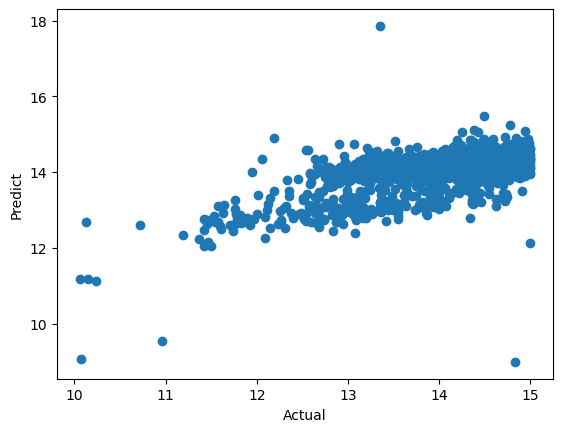

In [ ]:
load_type = 2
df_load_type = df_old[df_old['load_type'] == load_type]
# Get the columns that match the specified load type
cols = list_col

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_load_type[cols[1:]], df_load_type[cols[0]], test_size=0.2, random_state=42)

# Normalize the training data
X_train_norm = (X_train - X_train.mean()) / X_train.std()


weights_dict_2 = {}
weight_col = cols[1:]
lr = LinearRegression()
lr.fit(X_train_norm, y_train)
weights = lr.coef_
intercept_2 = lr.intercept_
for i in range(len(weight_col)):
  weights_dict_2[weight_col[i]] = weights[i]

# Evaluate the accuracy of the model on the testing set
X_test_norm = (X_test - X_train.mean()) / X_train.std()
y_pred = lr.predict(X_test_norm)
accuracy_2 = r2_score(y_test, y_pred)

print('Correlation:', accuracy_2)
print('Coefficients:', weights_dict_2)
print('intercept :',intercept_2)

import matplotlib.pyplot as plt
plt.scatter(y_test.values,y_pred)
plt.xlabel("Actual")
plt.ylabel("Predict")

Correlation: 0.5585338302515259
Coefficients: {'HP Shaft X Vibration': -0.5440941365698031, 'HP Shaft Y Vibration': 2.062680302395994, 'LP Shaft X Vibration': -0.6988386271594759, 'LP Shaft Y Vibration': -0.5431238947122373, 'T4 Metal Thrust BRG Temp': 0.13544611362007186, 'T5 Metal Thrust BRG Temp': 0.1430421389693413, 'Metal HP BRG Temp': 0.45868413714290596, 'T1 Metal Thrust BRG Temp': -0.02483534704203041, 'T2 Metal Thrust BRG Temp': 0.08302970327083743, 'T1 Metal LP BRG Temp': -0.7215081983344211, 'T2 Metal LP BRG Temp': -0.27972362826271985, 'Thrust Position 1': -1.5051509666369125, 'Thrust Position 2': 0.965657538327747, 'Differential Expansion A': 1.2904587589602377, 'Differential Expansion B': -1.6884986609938102, 'Condenser Pressure': 0.04005048772073023, 'Lube Oil Header Temp': 0.010084153776295231}
intercept : 16.027118683995106


Text(0, 0.5, 'Predict')

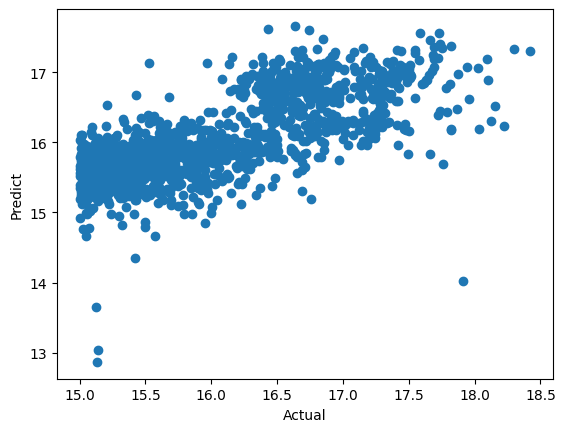

In [ ]:
load_type = 3
df_load_type = df_old[df_old['load_type'] == load_type]
# Get the columns that match the specified load type
cols = list_col

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_load_type[cols[1:]], df_load_type[cols[0]], test_size=0.2, random_state=42)

# Normalize the training data
X_train_norm = (X_train - X_train.mean()) / X_train.std()


weights_dict_3 = {}
weight_col = cols[1:]
lr = LinearRegression()
lr.fit(X_train_norm, y_train)
weights = lr.coef_
intercept_3 = lr.intercept_
for i in range(len(weight_col)):
  weights_dict_3[weight_col[i]] = weights[i]


# Evaluate the accuracy of the model on the testing set
X_test_norm = (X_test - X_train.mean()) / X_train.std()
y_pred = lr.predict(X_test_norm)
accuracy_3 = r2_score(y_test, y_pred)

print('Correlation:', accuracy_3)
print('Coefficients:', weights_dict_3)
print('intercept :',intercept_3)

import matplotlib.pyplot as plt
plt.scatter(y_test.values,y_pred)
plt.xlabel("Actual")
plt.ylabel("Predict")


Correlation: -1.303025723257334
Coefficients: {'HP Shaft X Vibration': 3.176793894934435, 'HP Shaft Y Vibration': -2.759376831508106, 'LP Shaft X Vibration': -1.654186553433492, 'LP Shaft Y Vibration': 0.6355644290864506, 'T4 Metal Thrust BRG Temp': -0.8390809110623233, 'T5 Metal Thrust BRG Temp': 1.8462777979105804, 'Metal HP BRG Temp': 0.2085604964904252, 'T1 Metal Thrust BRG Temp': 1.169663560562618, 'T2 Metal Thrust BRG Temp': -1.0952928483451252, 'T1 Metal LP BRG Temp': -0.2787364284124828, 'T2 Metal LP BRG Temp': 1.0325803697373797, 'Thrust Position 1': 8.35978000739919, 'Thrust Position 2': -6.346160427611701, 'Differential Expansion A': 11.68984228712187, 'Differential Expansion B': -11.311615648027345, 'Condenser Pressure': -0.11035244883324725, 'Lube Oil Header Temp': -0.18228932751622018}
intercept : 23.414650077819843


Text(0, 0.5, 'Predict')

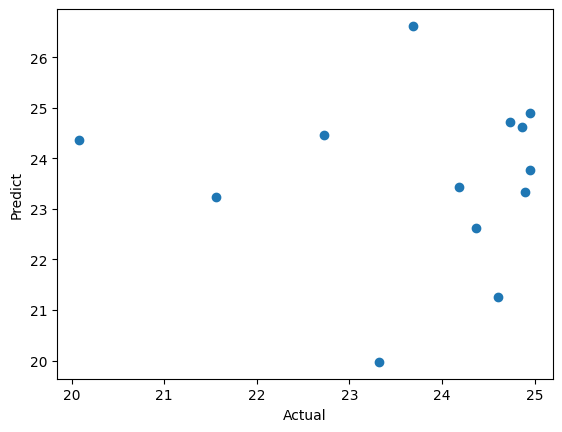

In [ ]:
load_type = 4
df_load_type = df_old[df_old['load_type'] == load_type]
# Get the columns that match the specified load type
cols = list_col

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_load_type[cols[1:]], df_load_type[cols[0]], test_size=0.2, random_state=42)

# Normalize the training data
X_train_norm = (X_train - X_train.mean()) / X_train.std()


weights_dict_4 = {}
weight_col = cols[1:]
lr = LinearRegression()
lr.fit(X_train_norm, y_train)
weights = lr.coef_
intercept_4 = lr.intercept_
for i in range(len(weight_col)):
  weights_dict_4[weight_col[i]] = weights[i]


# Evaluate the accuracy of the model on the testing set
X_test_norm = (X_test - X_train.mean()) / X_train.std()
y_pred = lr.predict(X_test_norm)
accuracy_4 = r2_score(y_test, y_pred)

print('Correlation:', accuracy_4)
print('Coefficients:', weights_dict_4)
print('intercept :',intercept_4)

import matplotlib.pyplot as plt
plt.scatter(y_test.values,y_pred)
plt.xlabel("Actual")
plt.ylabel("Predict")

Correlation: 0.45135985721430416
Coefficients: {'HP Shaft X Vibration': -0.5894300802193617, 'HP Shaft Y Vibration': 3.0251808001062424, 'LP Shaft X Vibration': -2.2171756017423374, 'LP Shaft Y Vibration': 0.32349510045833724, 'T4 Metal Thrust BRG Temp': 0.5475468623378059, 'T5 Metal Thrust BRG Temp': -0.4823892991349871, 'Metal HP BRG Temp': -0.010580899060271706, 'T1 Metal Thrust BRG Temp': -0.2521711180118397, 'T2 Metal Thrust BRG Temp': 0.30549953681434505, 'T1 Metal LP BRG Temp': -0.2031976013908179, 'T2 Metal LP BRG Temp': 0.06469958450054096, 'Thrust Position 1': -3.8024082661436585, 'Thrust Position 2': 3.8644363775861463, 'Differential Expansion A': -1.8877881879477167, 'Differential Expansion B': 1.930429602897241, 'Condenser Pressure': 0.21669747410235107, 'Lube Oil Header Temp': 0.010115344324320843}
intercept : 28.709900516099324


Text(0, 0.5, 'Predict')

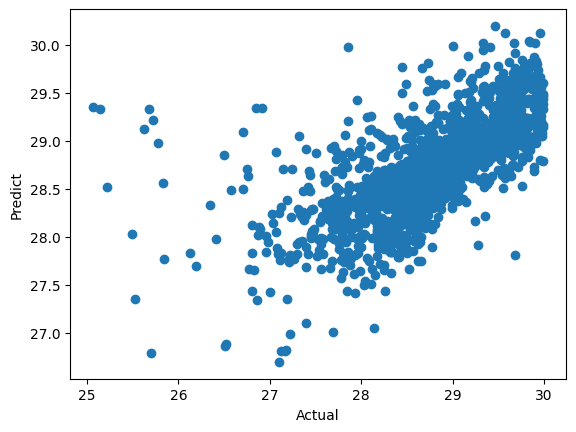

In [ ]:
load_type = 5
df_load_type = df_old[df_old['load_type'] == load_type]
# Get the columns that match the specified load type
cols = list_col

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_load_type[cols[1:]], df_load_type[cols[0]], test_size=0.2, random_state=42)

# Normalize the training data
X_train_norm = (X_train - X_train.mean()) / X_train.std()


weights_dict_5 = {}
weight_col = cols[1:]
lr = LinearRegression()
lr.fit(X_train_norm, y_train)
weights = lr.coef_
intercept_5 = lr.intercept_
for i in range(len(weight_col)):
  weights_dict_5[weight_col[i]] = weights[i]


# Evaluate the accuracy of the model on the testing set
X_test_norm = (X_test - X_train.mean()) / X_train.std()
y_pred = lr.predict(X_test_norm)
accuracy_5 = r2_score(y_test, y_pred)

print('Correlation:', accuracy_5)
print('Coefficients:', weights_dict_5)
print('intercept :',intercept_5)

import matplotlib.pyplot as plt
plt.scatter(y_test.values,y_pred)
plt.xlabel("Actual")
plt.ylabel("Predict")

Correlation: 0.5534547251393308
Coefficients: {'HP Shaft X Vibration': 0.6063439022845998, 'HP Shaft Y Vibration': 0.4005756375736228, 'LP Shaft X Vibration': -0.608622222274179, 'LP Shaft Y Vibration': -0.5508927374548946, 'T4 Metal Thrust BRG Temp': 0.10327420559398454, 'T5 Metal Thrust BRG Temp': -0.305177868209024, 'Metal HP BRG Temp': -0.4336478705534539, 'T1 Metal Thrust BRG Temp': -0.2271549395190932, 'T2 Metal Thrust BRG Temp': 0.04442253175950216, 'T1 Metal LP BRG Temp': -1.114672626681897, 'T2 Metal LP BRG Temp': 0.8330538884036729, 'Thrust Position 1': -1.4687839170798873, 'Thrust Position 2': 1.0781879639562642, 'Differential Expansion A': 0.005499805215643538, 'Differential Expansion B': 0.5893449858205877, 'Condenser Pressure': 1.0051805742944804, 'Lube Oil Header Temp': -0.10024269658915454}
intercept : 33.64989159817049


Text(0, 0.5, 'Predict')

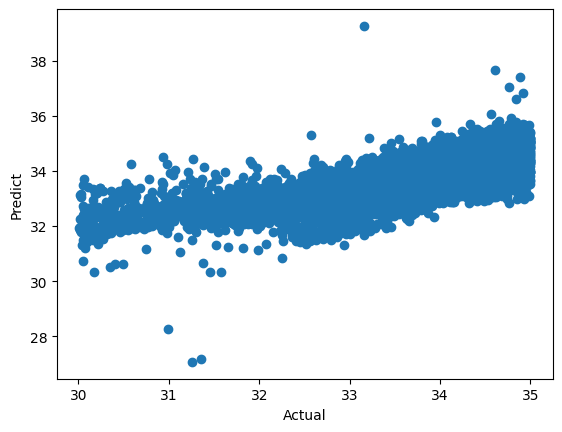

In [ ]:
load_type = 6
df_load_type = df_old[df_old['load_type'] == load_type]
# Get the columns that match the specified load type
cols = list_col

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_load_type[cols[1:]], df_load_type[cols[0]], test_size=0.2, random_state=42)

# Normalize the training data
X_train_norm = (X_train - X_train.mean()) / X_train.std()


weights_dict_6 = {}
weight_col = cols[1:]
lr = LinearRegression()
lr.fit(X_train_norm, y_train)
weights = lr.coef_
intercept_6 = lr.intercept_
for i in range(len(weight_col)):
  weights_dict_6[weight_col[i]] = weights[i]


# Evaluate the accuracy of the model on the testing set
X_test_norm = (X_test - X_train.mean()) / X_train.std()
y_pred = lr.predict(X_test_norm)
accuracy_6 = r2_score(y_test, y_pred)

print('Correlation:', accuracy_6)
print('Coefficients:', weights_dict_6)
print('intercept :',intercept_6)

import matplotlib.pyplot as plt
plt.scatter(y_test.values,y_pred)
plt.xlabel("Actual")
plt.ylabel("Predict")

Correlation: 0.4606889810364281
Coefficients: {'HP Shaft X Vibration': -0.24071307700082833, 'HP Shaft Y Vibration': 0.12501881367316797, 'LP Shaft X Vibration': 0.3524634550737907, 'LP Shaft Y Vibration': -0.44769842773726615, 'T4 Metal Thrust BRG Temp': 0.05727782420108048, 'T5 Metal Thrust BRG Temp': 0.12121169792964807, 'Metal HP BRG Temp': 0.11314728160995505, 'T1 Metal Thrust BRG Temp': 0.008684659144857228, 'T2 Metal Thrust BRG Temp': 0.011305713996514385, 'T1 Metal LP BRG Temp': -0.1097578168085227, 'T2 Metal LP BRG Temp': 0.02168206602001154, 'Thrust Position 1': -0.6093156005363484, 'Thrust Position 2': 0.3080898735870017, 'Differential Expansion A': -0.01986425478578779, 'Differential Expansion B': 0.0793616455263249, 'Condenser Pressure': 0.04536891914076518, 'Lube Oil Header Temp': -0.024443009130975715}
intercept : 35.62321064217017


Text(0, 0.5, 'Predict')

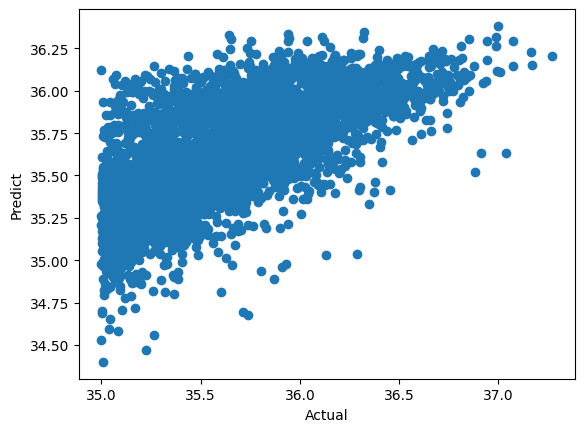

In [ ]:
load_type = 7
df_load_type = df_old[df_old['load_type'] == load_type]
# Get the columns that match the specified load type
cols = list_col

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_load_type[cols[1:]], df_load_type[cols[0]], test_size=0.2, random_state=42)

# Normalize the training data
X_train_norm = (X_train - X_train.mean()) / X_train.std()


weights_dict_7 = {}
weight_col = cols[1:]
lr = LinearRegression()
lr.fit(X_train_norm, y_train)
weights = lr.coef_
intercept_7 = lr.intercept_
for i in range(len(weight_col)):
  weights_dict_7[weight_col[i]] = weights[i]


# Evaluate the accuracy of the model on the testing set
X_test_norm = (X_test - X_train.mean()) / X_train.std()
y_pred = lr.predict(X_test_norm)
accuracy_7 = r2_score(y_test, y_pred)

print('Correlation:', accuracy_7)
print('Coefficients:', weights_dict_7)
print('intercept :',intercept_7)

import matplotlib.pyplot as plt
plt.scatter(y_test.values,y_pred)
plt.xlabel("Actual")
plt.ylabel("Predict")

In [ ]:
DataCoef = pd.DataFrame(data=[weights_dict_2,weights_dict_3,weights_dict_4,weights_dict_5,weights_dict_6,weights_dict_7])
DataCoef.to_excel("Coef.xlsx")

In [ ]:
#create linear regression coefficient dataframe
dict_list = [weights_dict_2,weights_dict_3,weights_dict_4,weights_dict_5,weights_dict_6,weights_dict_7]

dfw2 = pd.DataFrame(weights_dict_2,index=['2 low'])
dfw3 = pd.DataFrame(weights_dict_3,index=['3 lowmed'])
dfw4 = pd.DataFrame(weights_dict_4,index=['4 med'])
dfw5 = pd.DataFrame(weights_dict_5,index=['5 highmed'])
dfw6 = pd.DataFrame(weights_dict_6,index=['6 high'])
dfw7 = pd.DataFrame(weights_dict_7,index=['7 highhigh'])

dfw = pd.concat([dfw2,dfw3,dfw4,dfw5,dfw6,dfw7],axis=0)
dfw

,HP Shaft X Vibration,HP Shaft Y Vibration,LP Shaft X Vibration,LP Shaft Y Vibration,T4 Metal Thrust BRG Temp,T5 Metal Thrust BRG Temp,Metal HP BRG Temp,T1 Metal Thrust BRG Temp,T2 Metal Thrust BRG Temp,T1 Metal LP BRG Temp,T2 Metal LP BRG Temp,Thrust Position 1,Thrust Position 2,Differential Expansion A,Differential Expansion B,Condenser Pressure,Lube Oil Header Temp
2 low,-1.783300,3.147799,-1.343007,0.022934,0.090324,-0.025251,0.044647,-0.124116,0.235866,-0.618298,0.018319,-0.421850,-0.186665,1.864722,-1.973898,0.170564,0.018882
3 lowmed,-0.544094,2.062680,-0.698839,-0.543124,0.135446,0.143042,0.458684,-0.024835,0.083030,-0.721508,-0.279724,-1.505151,0.965658,1.290459,-1.688499,0.040050,0.010084
4 med,3.176794,-2.759377,-1.654187,0.635564,-0.839081,1.846278,0.208560,1.169664,-1.095293,-0.278736,1.032580,8.359780,-6.346160,11.689842,-11.311616,-0.110352,-0.182289
5 highmed,-0.589430,3.025181,-2.217176,0.323495,0.547547,-0.482389,-0.010581,-0.252171,0.305500,-0.203198,0.064700,-3.802408,3.864436,-1.887788,1.930430,0.216697,0.010115
6 high,0.606344,0.400576,-0.608622,-0.550893,0.103274,-0.305178,-0.433648,-0.227155,0.044423,-1.114673,0.833054,-1.468784,1.078188,0.005500,0.589345,1.005181,-0.100243
7 highhigh,-0.240713,0.125019,0.352463,-0.447698,0.057278,0.121212,0.113147,0.008685,0.011306,-0.109758,0.021682,-0.609316,0.308090,-0.019864,0.079362,0.045369,-0.024443


Manual Filter and generate detail graph

In [ ]:
df_old = df[(df['DateTime'] >=n_start)  & (df['DateTime'] < n_end)]
df_new = df[(df['DateTime'] >=c_start)  & (df['DateTime'] < c_end)]

In [ ]:
# Normalize data function
def normalize_data(data, reference_data):
    return (data - reference_data.min()) / (reference_data.max() - reference_data.min())

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


"""
This function is used to compare the given datasets and detect any anomalies or differences between them.
It returns scores to help understand how different the current dataset is from the normal dataset, and visualizations are created to aid in understanding the data.
"""
# 1. The function takes the following parameters:
"""
df_current : current or interested period of data
df_normal : base-line data, verified normal data
load_type : input parameter to filter current, normal data
weights_dict (optional):: dictionary which contain references weights of each sensor and load_type, calculated by regression model
df_concat (optional):: dataframe that contain the detail calculation information
day (optional):: Business date of data, default value is 999
"""
def detect_anomalies(df_current, df_normal, load_type, weights_dict=None,df_concat=None,day=999):
  #2. Initialize empty lists for anomaly frequency scores and centralize difference scores.
    anomaly_freq_scores = []
    centralize_differ_scores = []
    df_concat=df_concat
  #3. Filter the current and normal datasets based on the specified load_type.
    df_current = df_current[df_current['load_type']==load_type]
    df_normal = df_normal[df_normal['load_type']==load_type]
  #4. Loop through each column in the current dataset that matches the specified type and load_type.
  #5. If the column is not in the weights dictionary, set its weight to 1. Otherwise, use the weight specified in the dictionary.
    for col in df_current[list_sensor]:
        df_data_concat = []
        if col not in weights_dict.keys():
            weight = 1
        else:
            weight = weights_dict[col]
            #print("Weight :")
            #print(weight)

  #6. Create a boxplot to visualize the distribution of the data for the current and normal datasets.
        #Define scale
        ymin = min(df_current[col].min(), df_normal[col].min())
        ymax = max(df_current[col].max(), df_normal[col].max())
        yrange = ymax - ymin
        fig, ax = plt.subplots()
        ax.boxplot([df_current[col], df_normal[col]], labels=["Current", "Normal"])
        ax.set_title(col)
        ax.set_ylim(ymin - yrange*0.1, ymax + yrange*0.1)

  #7. Save the boxplot as an image file
        filename = f"{col}_Box_Plot_{load_type}.png"
        filepath = os.path.join('/content/drive/MyDrive/MyPlots/GNK2', filename)
        plt.savefig(filepath)

        #Show visual
        plt.show()

  #8. Calculate data in each the column in the current and normal datasets.
        ma_current = df_current[col]
        ma_normal = df_normal[col]

  #9. Determine the upper and lower bounds of sensor for using the normal dataset.
        std_normal = ma_normal.std()
        upper_bound_normal = ma_normal.mean() + 2*std_normal
        lower_bound_normal = ma_normal.mean() - 2*std_normal

  #10. Calculate the percentage of values in the current and normal datasets that fall outside of the bounds.
        #Current
        outliers_current = df_current[(df_current[col] < lower_bound_normal) | (df_current[col] > upper_bound_normal)]
        percent_outliers_current = len(outliers_current) / len(df_current) * 100
        print("percent_outliers_current :"+ str(percent_outliers_current))
        #Normal
        outliers_normal = df_normal[(df_normal[col] < lower_bound_normal) | (df_normal[col] > upper_bound_normal)]
        percent_outliers_normal = len(outliers_normal) / len(df_normal) * 100
        print("percent_outliers_normal :"+ str(percent_outliers_normal))

  #11. Create a density plot and bounds visualization, and save it as an image file.
        plt.figure(figsize=(12, 6))
        sns.kdeplot(ma_current, label="Current Data", alpha=0.8, common_norm=False, shade=True)
        sns.kdeplot(ma_normal, label="Normal Data", alpha=0.8, common_norm=False, shade=True)
        plt.axvline(upper_bound_normal, color='r', linestyle="--", label="Upper Bound (Normal)")
        plt.axvline(lower_bound_normal, color='r', linestyle="--", label="Lower Bound (Normal)")
        plt.axvline(ma_normal.mean(), color='g', linestyle="--", label="Mean (Normal)")
        plt.axvline(ma_current.mean(), color='b', linestyle="--", label="Mean (Current)")

        plt.title(f"{col} - Density Plot and Bounds -" +str(load_type))
        plt.legend()
        filename = f"{col}_Density_Plot_and_Bounds_{load_type}.png"
        filepath = os.path.join('/content/drive/MyDrive/MyPlots/GNK2', filename)
        plt.savefig(filepath)
        plt.show()

  #12. Normalize data for both datasets.
        #Fix scale of current normalized to be the same as normal data
        ma_current_normalized = normalize_data(ma_current,ma_normal)
        ma_normal_normalized = normalize_data(ma_normal,ma_normal)
  #13. Calculate the mean and median differences between the normalized data.
        norm_mean = ma_normal_normalized.mean()
        curr_mean = ma_current_normalized.mean()
        norm_median = ma_normal_normalized.median()
        curr_median = ma_current_normalized.median()

  #14. If the percentage of outliers in the current dataset is greater than in the normal dataset, calculate the difference between the two percentages.
        if percent_outliers_current > percent_outliers_normal:
          diff_percent_outliers = np.abs(percent_outliers_current - percent_outliers_normal)
          print("diff_percent_outliers =")
          print(diff_percent_outliers)
        else:
          diff_percent_outliers = 0
          print("no diff_percent_outliers")
          print(diff_percent_outliers)
  #15. Compute an anomaly frequency score using the difference between the percentage of outliers and the weight for the column.
#  Comment out V1.1
        # Add a small constant to prevent division by zero
#        epsilon = 1e-6

        # Compute a score for the difference between normal and abnormal
#        if percent_outliers_normal < 1 :
#          percent_outliers_normal = 1

#        anomaly_freq_score = weight * diff_percent_outliers / (percent_outliers_normal + epsilon)
#        anomaly_freq_scores.append(anomaly_freq_score)

        anomaly_freq_score = weight * diff_percent_outliers  #V1.1++
        anomaly_freq_scores.append(anomaly_freq_score)       #V1.1++

  #16. Compute a centralize difference score using the mean and median differences.
        mean_diff = np.abs(norm_mean - curr_mean)
        median_diff = np.abs(norm_median - curr_median)
        centralize_differ_score = (mean_diff + median_diff) / 2
        if centralize_differ_score is None or pd.isnull(centralize_differ_score):
          centralize_differ_score = 0
        else:
          centralize_differ_score = centralize_differ_score
        centralize_differ_scores.append(centralize_differ_score)

  #17. Append the results into a dataframe and concatenate it with the previously concatenated dataframe.
        df_data_concat.append({'Sensor': col, 'Load_Type': load_type, 'Percent_Outliers_Current': percent_outliers_current, 'Percent_Outliers_Normal': percent_outliers_normal, 'Diff_Percent_Outliers': diff_percent_outliers, 'Anomaly_Freq_Score': anomaly_freq_score, 'Norm_Mean': norm_mean, 'Curr_Mean': curr_mean, 'Mean_Diff': mean_diff, 'Norm_Median': norm_median, 'Curr_Median': curr_median, 'Median_Diff': median_diff, 'Centralize_Differ_Score': centralize_differ_score,'Day':day, 'Count': len(df_current) })
        df_data_concat_df = pd.DataFrame(df_data_concat)
        df_concat = pd.concat([df_concat, df_data_concat_df], ignore_index=True)


  #18. After looping through all sensor, calculate the overall anomaly score and centralize difference score as the mean of their respective lists.
   # overall_anomaly_score = np.mean(anomaly_freq_scores)
   # overall_centralize_differ_score = np.mean(centralize_differ_scores)
    overall_anomaly_score = np.sum(anomaly_freq_scores)
    overall_centralize_differ_score = np.sum(centralize_differ_scores)
#19. Return the overall anomaly score, centralize difference score, and the concatenated dataframe.
    return overall_anomaly_score,overall_centralize_differ_score,df_concat

In [ ]:
"""
This function is used to compare the given datasets and detect any anomalies or differences between them.
It returns scores to help understand how different the current dataset is from the normal dataset with no return the visualize
"""
# 1. The function takes the following parameters:
"""
df_current : current or interested period of data
df_normal : base-line data, verified normal data
load_type : input parameter to filter current, normal data
weights_dict (optional):: dictionary which contain references weights of each sensor and load_type, calculated by regression model
df_concat (optional):: dataframe that contain the detail calculation information
day (optional):: Business date of data, default value is 999
"""
def detect_anomalies_no_plot(df_current, df_normal, load_type, weights_dict_=None,df_concat=None,day=999):
#2. Initialize empty lists for anomaly frequency scores and centralize difference scores.
    anomaly_freq_scores = []
    centralize_differ_scores = []
    df_concat=df_concat
#3. Filter the current and normal datasets based on the specified load_type.
    df_current = df_current[df_current['load_type']==load_type]
    df_normal = df_normal[df_normal['load_type']==load_type]
#4. Loop through each column in the current dataset that matches the specified type and load_type.
#5. If the column is not in the weights dictionary, set its weight to 1. Otherwise, use the weight specified in the dictionary.
    for col in df_current[list_sensor]:
        df_data_concat = []
        if col not in weights_dict_.keys():
            weight = 0  #change from 1
        else:
            weight = weights_dict_[col]
           # if(day == 3 and load_type == 3.0):
            #  print(col)
            #  print(weight)
            #  print("---------------")
#6. Create a boxplot to visualize the distribution of the data for the current and normal datasets.
        #Define scale
        ymin = min(df_current[col].min(), df_normal[col].min())
        ymax = max(df_current[col].max(), df_normal[col].max())
        yrange = ymax - ymin
#7. Save the boxplot as an image file
        """
        # Create a boxplot to visualize the distribution of the data
        fig, ax = plt.subplots()
        ax.boxplot([df_current[col], df_normal[col]], labels=["Current", "Normal"])
        ax.set_title(col)
        ax.set_ylim(ymin - yrange*0.1, ymax + yrange*0.1)

        # Save the plot to a file with the col and load_type in the filename
        filename = f"{col}_Box_Plot_{load_type}.png"
        filepath = os.path.join('/content/drive/MyDrive/MyPlots', filename)
        plt.savefig(filepath)
        #Show visual
        plt.show()
        """
#8. Calculate data un each the column in the current and normal datasets.
        ma_current = df_current[col]
        ma_normal = df_normal[col]
#9. Determine the upper and lower bounds of sensor for using the normal dataset.
        std_normal = ma_normal.std()
        upper_bound_normal = ma_normal.mean() + 2*std_normal
        lower_bound_normal = ma_normal.mean() - 2*std_normal

#10. Calculate the percentage of data values in the current and normal datasets that fall outside of the bounds.
        #Current
        outliers_current = df_current[(df_current[col] < lower_bound_normal) | (df_current[col] > upper_bound_normal)]
        percent_outliers_current = len(outliers_current) / len(df_current) * 100
      #  print("percent_outliers_current :"+ str(percent_outliers_current))
        #Normal
        outliers_normal = df_normal[(df_normal[col] < lower_bound_normal) | (df_normal[col] > upper_bound_normal)]
        percent_outliers_normal = len(outliers_normal) / len(df_normal) * 100
      #  print("percent_outliers_normal :"+ str(percent_outliers_normal))
#11. Create a density plot and bounds visualization, and save it as an image file.
        """
        plt.figure(figsize=(12, 6))
        sns.kdeplot(ma_current, label="Current Data", alpha=0.8, common_norm=False, shade=True)
        sns.kdeplot(ma_normal, label="Normal Data", alpha=0.8, common_norm=False, shade=True)
        plt.axvline(upper_bound_normal, color='r', linestyle="--", label="Upper Bound (Normal)")
        plt.axvline(lower_bound_normal, color='r', linestyle="--", label="Lower Bound (Normal)")
        plt.axvline(ma_normal.mean(), color='g', linestyle="--", label="Mean (Normal)")
        plt.axvline(ma_current.mean(), color='b', linestyle="--", label="Mean (Current)")

        plt.title(f"{col} - Density Plot and Bounds -" +str(load_type))
        plt.legend()
        filename = f"{col}_Density_Plot_and_Bounds_{load_type}.png"
        filepath = os.path.join('/content/drive/MyDrive/MyPlots', filename)
        # plt.savefig(filepath)
        plt.show()
        """
#12. Normalize data for both datasets.
        #Fix scale of current normalized to be the same as normal data

        ma_current_normalized = normalize_data(ma_current,ma_normal)
        ma_normal_normalized = normalize_data(ma_normal,ma_normal)
#13. Calculate the mean and median differences between the normalized data.
        norm_mean = ma_normal_normalized.mean()
        curr_mean = ma_current_normalized.mean()
        norm_median = ma_normal_normalized.median()
        curr_median = ma_current_normalized.median()

#14. If the percentage of outliers in the current dataset is greater than in the normal dataset, calculate the difference between the two percentages.
        if percent_outliers_current > percent_outliers_normal:
          diff_percent_outliers = np.abs(percent_outliers_current - percent_outliers_normal)
          #if(day == 3 and load_type == 3.0):
            #print("diff_percent_outliers =")
            #print(diff_percent_outliers)
            #print("---------------")
        else:
          diff_percent_outliers = 0
       #   print("no diff_percent_outliers")
       #   print(diff_percent_outliers)
#15. Compute an anomaly frequency score using the difference between the percentage of outliers and the weight for the column.

       #V1.1++
        anomaly_freq_score = weight * diff_percent_outliers
        anomaly_freq_scores.append(anomaly_freq_score)
        #if(day == 3 and load_type == 3.0):
             # print(anomaly_freq_score)
              #print(diff_percent_outliers)

#16. Compute a centralize difference score using the mean and median differences.
        mean_diff = np.abs(norm_mean - curr_mean)
        median_diff = np.abs(norm_median - curr_median)
        # Compute centralize_differ_score
        centralize_differ_score = (mean_diff + median_diff) / 2
        if centralize_differ_score is None or pd.isnull(centralize_differ_score):
          centralize_differ_score = 0
        else:
          centralize_differ_score = centralize_differ_score
        centralize_differ_scores.append(centralize_differ_score)

#17. Append the results into a dataframe and concatenate it with the previously concatenated dataframe.
        df_data_concat.append({'Sensor': col, 'Load_Type': load_type, 'Percent_Outliers_Current': percent_outliers_current, 'Percent_Outliers_Normal': percent_outliers_normal, 'Diff_Percent_Outliers': diff_percent_outliers, 'Anomaly_Freq_Score': anomaly_freq_score, 'Norm_Mean': norm_mean, 'Curr_Mean': curr_mean, 'Mean_Diff': mean_diff, 'Norm_Median': norm_median, 'Curr_Median': curr_median, 'Median_Diff': median_diff, 'Centralize_Differ_Score': centralize_differ_score,'Day': day, 'Count': len(df_current) })
        df_data_concat_df = pd.DataFrame(df_data_concat)
        df_concat = pd.concat([df_concat, df_data_concat_df], ignore_index=True)
        # display(df_concat)
#18. After looping through all sensor, calculate the overall anomaly score and centralize difference score as the mean of their respective lists.
    #overall_anomaly_score = np.mean(anomaly_freq_scores)
    #overall_centralize_differ_score = np.mean(centralize_differ_scores)
    overall_anomaly_score = np.sum(anomaly_freq_scores)  #Change avg to sum
    overall_centralize_differ_score = np.sum(centralize_differ_scores) #Change avg to sum
#19. Return the overall anomaly score, centralize difference score, and the concatenated dataframe.
    return overall_anomaly_score,overall_centralize_differ_score,df_concat


Health Score

In [ ]:
#**** Health Score *******

import os
from google.colab import drive

# Mount your Google Drive
#drive.mount('/content/drive')

# Create a folder on your Google Drive to save the plots
#if not os.path.exists('/content/drive/MyDrive/MyPlots/GNK2'):
#    os.makedirs('/content/drive/MyDrive/MyPlots/GNK2')


# Load the current dataset
df_current = df_new.copy()
# Load the reference normal dataset
df_normal = df_old.copy()

# Define the weights for each sensor in each load type
weights_dict_ = {}

# Get the unique values of the load_type column in df_current
load_types = df_current['load_type'].unique()

# Call the function to detect anomalies for each load type
overall_anomaly_score_summary_weighted={}             #V1.1++
overall_centralize_differ_score_summary_weighted={}   #V1.1++
overall_anomaly_score_summary={}
overall_centralize_differ_score_summary={}
df_concat=pd.DataFrame()

# Define start and ending for looping
start_day = df_new['day'].min()
end_day = df_new['day'].max()

results = pd.DataFrame(columns=['day',
                                'overall_anomaly_score_summary_2', 'overall_anomaly_score_summary_3',
                                'overall_anomaly_score_summary_4', 'overall_anomaly_score_summary_5',
                                'overall_anomaly_score_summary_6', 'overall_anomaly_score_summary_7',
                                'system_score_freq',
                                'overall_centralize_differ_score_summary_2','overall_centralize_differ_score_summary_3',
                                'overall_centralize_differ_score_summary_4','overall_centralize_differ_score_summary_5',
                                'overall_centralize_differ_score_summary_6','overall_centralize_differ_score_summary_7',
                                'system_score_diff'])

for day in range(start_day, end_day + 1):
    system_score_freq = 0
    df_new_filter = df_new[df_new['day'] == day] #V1.1++
    sum_weight = 0 #V1.1++
#initial variable  V1.1++
    overall_anomaly_score = 0
    overall_centralize_differ_score = 0
    overall_anomaly_score_summary.clear()
    overall_centralize_differ_score_summary.clear()
    overall_anomaly_score_summary_weighted.clear()
    overall_centralize_differ_score_summary_weighted.clear()
    load_weights = []
    load_weights.clear()
    load_types = []
    weight = []
    weight.clear()

#----------------------

#Comment out V1.1
#    if day < 3 :
#      df_new_filter = df_new[(df_new['day'] >= 1) & (df_new['day'] <= day)]
#    else:
#      df_new_filter = df_new[(df_new['day'] >= day - 2) & (df_new['day'] <= day)]
#   print(df_new_filter['day'].unique())
#-------------------------------------

    # Load the current dataset
    df_current = df_new_filter
    # Load the reference normal dataset
    df_normal = df_old

    load_types = df_current['load_type'].unique()

    #Cal load type proportion\
    total_count = sum(load_types)  # Calculate the total count of occurrences
    weights = [count / total_count for count in load_types]  # Calculate the proportions as weights
    load_weights = dict(zip(load_types, weights))  # Create a dictionary mapping load types to their weights
   # print("Load Type\tProportion (Weight)")
  #  for load_type, weight in load_weights.items():
   #   print(f"{load_type}\t\t{weight:.2f}")


    for load_type in load_types:
      overall_anomaly_score = 0
      overall_centralize_differ_score = 0
      if (load_type == 2 and load_weights.get(load_type) > 0.00) :
        sum_weight = sum_weight + load_weights.get(load_type)
        overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies_no_plot(df_current, df_normal, load_type, weights_dict_=weights_dict[load_type],df_concat=df_concat,day=day)
      elif (load_type == 3 and load_weights.get(load_type) > 0.00) :
        sum_weight = sum_weight + load_weights.get(load_type)
        overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies_no_plot(df_current, df_normal, load_type, weights_dict_=weights_dict[load_type],df_concat=df_concat,day=day)
      elif (load_type == 4 and load_weights.get(load_type) > 0.00) :
        sum_weight = sum_weight + load_weights.get(load_type)
        overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies_no_plot(df_current, df_normal, load_type, weights_dict_=weights_dict[load_type],df_concat=df_concat,day=day)
      elif (load_type == 5 and load_weights.get(load_type) > 0.00) :
        sum_weight = sum_weight + load_weights.get(load_type)
        overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies_no_plot(df_current, df_normal, load_type, weights_dict_=weights_dict[load_type],df_concat=df_concat,day=day)
      elif (load_type == 6 and load_weights.get(load_type) > 0.00) :
        sum_weight = sum_weight + load_weights.get(load_type)
        overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies_no_plot(df_current, df_normal, load_type, weights_dict_=weights_dict[load_type],df_concat=df_concat,day=day)
      elif (load_type == 7 and load_weights.get(load_type) > 0.00) :
        sum_weight = sum_weight + load_weights.get(load_type)
        overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies_no_plot(df_current, df_normal, load_type, weights_dict_=weights_dict[load_type],df_concat=df_concat,day=day)

# Old formula ********** V1.1
      # overall_anomaly_score_summary[load_type] = overall_anomaly_score
      # overall_centralize_differ_score_summary[load_type] = overall_centralize_differ_score
      # system_score_freq = sum(overall_anomaly_score_summary.values()) / len(overall_anomaly_score_summary)
      # system_score_diff = sum(overall_centralize_differ_score_summary.values()) / len(overall_centralize_differ_score_summary)

# New formula ***********  V1.1
      #sum_weight = sum_weight + load_weights.get(load_type)
      overall_anomaly_score_summary_weighted[load_type] = overall_anomaly_score * load_weights.get(load_type)
      overall_centralize_differ_score_summary_weighted[load_type] = overall_centralize_differ_score * load_weights.get(load_type)
      overall_anomaly_score_summary[load_type] = overall_anomaly_score
      overall_centralize_differ_score_summary[load_type] = overall_centralize_differ_score
#-----------------------------------------------------------------------------------------------

# New Scoring V1.1
    if sum_weight == 0:
      sum_weight = 1
    system_score_freq = sum(overall_anomaly_score_summary_weighted.values())/sum_weight
    system_score_diff = sum(overall_centralize_differ_score_summary_weighted.values())/sum_weight
    results = results.append({'day': day,
                          'overall_anomaly_score_summary_2': overall_anomaly_score_summary.get(2),
                          'overall_anomaly_score_summary_3': overall_anomaly_score_summary.get(3),
                          'overall_anomaly_score_summary_4': overall_anomaly_score_summary.get(4),
                          'overall_anomaly_score_summary_5': overall_anomaly_score_summary.get(5),
                          'overall_anomaly_score_summary_6': overall_anomaly_score_summary.get(6),
                          'overall_anomaly_score_summary_7': overall_anomaly_score_summary.get(7),
                          'system_score_freq': system_score_freq,
                          'overall_centralize_differ_score_summary_2': overall_centralize_differ_score_summary.get(2),
                          'overall_centralize_differ_score_summary_3': overall_centralize_differ_score_summary.get(3),
                          'overall_centralize_differ_score_summary_4': overall_centralize_differ_score_summary.get(4),
                          'overall_centralize_differ_score_summary_5': overall_centralize_differ_score_summary.get(5),
                          'overall_centralize_differ_score_summary_6': overall_centralize_differ_score_summary.get(6),
                          'overall_centralize_differ_score_summary_7': overall_centralize_differ_score_summary.get(7),
                          'system_score_diff': system_score_diff,
                          'weight_2': load_weights.get(2),
                          'weight_3': load_weights.get(3),
                          'weight_4': load_weights.get(4),
                          'weight_5': load_weights.get(5),
                          'weight_6': load_weights.get(6),
                          'weight_7': load_weights.get(7),
                          },
                         ignore_index=True)


In [ ]:
results

,day,overall_anomaly_score_summary_2,overall_anomaly_score_summary_3,overall_anomaly_score_summary_4,overall_anomaly_score_summary_5,overall_anomaly_score_summary_6,overall_anomaly_score_summary_7,system_score_freq,overall_centralize_differ_score_summary_2,overall_centralize_differ_score_summary_3,overall_centralize_differ_score_summary_4,overall_centralize_differ_score_summary_5,overall_centralize_differ_score_summary_6,overall_centralize_differ_score_summary_7,system_score_diff,weight_2,weight_3,weight_4,weight_5,weight_6,weight_7
0,1.0,NaN,NaN,NaN,NaN,10.120831,12.663185,11.489791,NaN,NaN,NaN,NaN,2.566900,4.595746,3.659355,NaN,NaN,NaN,NaN,0.461538,0.538462
1,2.0,NaN,NaN,NaN,23.549881,5.775191,0.000000,8.466697,NaN,NaN,NaN,3.553538,2.282464,4.298130,3.419411,NaN,NaN,NaN,0.277778,0.333333,0.388889
2,3.0,NaN,0.517966,NaN,6.603562,0.000000,0.516409,1.818408,NaN,1.654105,NaN,2.848225,2.079902,4.165253,2.897125,NaN,0.142857,NaN,0.238095,0.285714,0.333333
3,4.0,2.400832,0.000000,0.0,9.785262,0.000000,0.000000,1.989925,2.240909,1.911521,1.747226,2.846076,1.886917,4.690568,2.799672,0.074074,0.111111,0.148148,0.185185,0.222222,0.259259
4,5.0,1.478610,0.000000,NaN,NaN,NaN,NaN,0.591444,2.322474,1.981975,NaN,NaN,NaN,NaN,2.118175,0.400000,0.600000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,177.0,19.657879,27.039289,NaN,15.327054,15.137391,7.639891,14.842282,3.325981,4.320508,NaN,2.754519,2.197077,4.255440,3.319853,0.086957,0.130435,NaN,0.217391,0.260870,0.304348
177,178.0,NaN,NaN,NaN,13.296975,9.711102,NaN,11.341044,NaN,NaN,NaN,2.915593,2.227001,NaN,2.539998,NaN,NaN,NaN,0.454545,0.545455,NaN
178,179.0,NaN,NaN,NaN,16.294113,15.511556,34.258294,23.019331,NaN,NaN,NaN,3.066835,2.438663,5.266979,3.713056,NaN,NaN,NaN,0.277778,0.333333,0.388889
179,180.0,NaN,NaN,NaN,15.090296,18.530522,28.990451,21.642654,NaN,NaN,NaN,2.984282,2.460496,5.286884,3.705143,NaN,NaN,NaN,0.277778,0.333333,0.388889


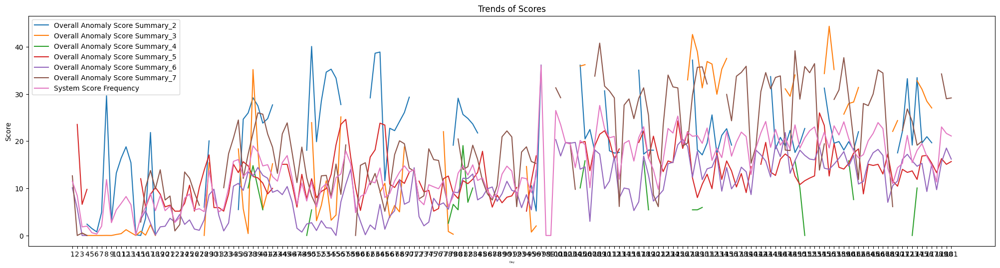

In [ ]:
#Overall Anomaly Score Summary
results['day'] = results['day'].round().astype(int)
plt.figure(figsize=(25, 6))
#plt.plot(results['day'], results['overall_anomaly_score_summary_0'], label='Overall Anomaly Score Summary_0')
#plt.plot(results['day'], results['overall_anomaly_score_summary_1'], label='Overall Anomaly Score Summary_1')
plt.plot(results['day'], results['overall_anomaly_score_summary_2'], label='Overall Anomaly Score Summary_2')
plt.plot(results['day'], results['overall_anomaly_score_summary_3'], label='Overall Anomaly Score Summary_3')
plt.plot(results['day'], results['overall_anomaly_score_summary_4'], label='Overall Anomaly Score Summary_4')
plt.plot(results['day'], results['overall_anomaly_score_summary_5'], label='Overall Anomaly Score Summary_5')
plt.plot(results['day'], results['overall_anomaly_score_summary_6'], label='Overall Anomaly Score Summary_6')
plt.plot(results['day'], results['overall_anomaly_score_summary_7'], label='Overall Anomaly Score Summary_7')
plt.plot(results['day'], results['system_score_freq'], label='System Score Frequency')

plt.xlabel('Day', fontsize=4)
plt.ylabel('Score')
plt.title('Trends of Scores')

# Set the xticks
plt.xticks(np.arange(start_day, end_day + 1, step=1))
plt.legend()
plt.show()

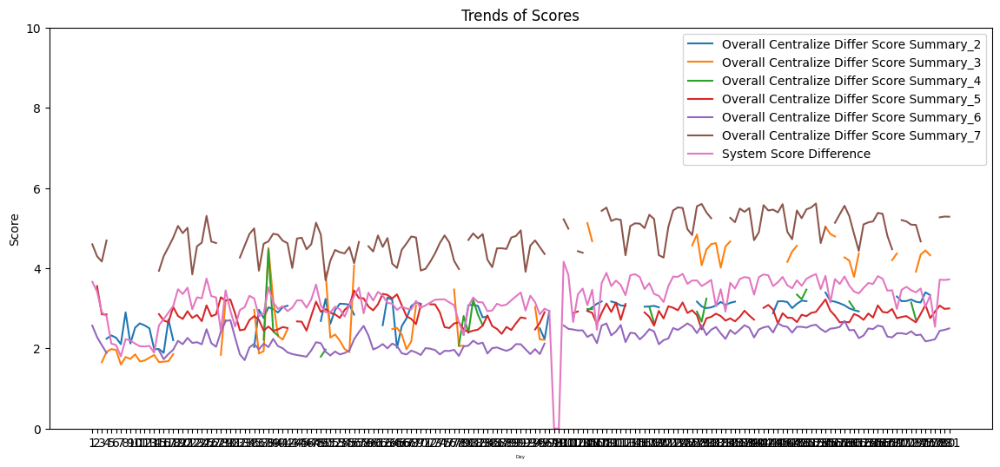

In [ ]:
results['day'] = results['day'].round().astype(int)
plt.figure(figsize=(14, 6))
plt.plot(results['day'], results['overall_centralize_differ_score_summary_2'], label='Overall Centralize Differ Score Summary_2')
plt.plot(results['day'], results['overall_centralize_differ_score_summary_3'], label='Overall Centralize Differ Score Summary_3')
plt.plot(results['day'], results['overall_centralize_differ_score_summary_4'], label='Overall Centralize Differ Score Summary_4')
plt.plot(results['day'], results['overall_centralize_differ_score_summary_5'], label='Overall Centralize Differ Score Summary_5')
plt.plot(results['day'], results['overall_centralize_differ_score_summary_6'], label='Overall Centralize Differ Score Summary_6')
plt.plot(results['day'], results['overall_centralize_differ_score_summary_7'], label='Overall Centralize Differ Score Summary_7')
plt.plot(results['day'], results['system_score_diff'], label='System Score Difference')

plt.xlabel('Day', fontsize=4)
plt.ylabel('Score')
plt.title('Trends of Scores')
plt.ylim([0, 10])

# Set the xticks
plt.xticks(np.arange(start_day, end_day + 1, step=1))
plt.legend()
plt.show()

In [ ]:
results.columns

Index(['day', 'overall_anomaly_score_summary_2',
       'overall_anomaly_score_summary_3', 'overall_anomaly_score_summary_4',
       'overall_anomaly_score_summary_5', 'overall_anomaly_score_summary_6',
       'overall_anomaly_score_summary_7', 'system_score_freq',
       'overall_centralize_differ_score_summary_2',
       'overall_centralize_differ_score_summary_3',
       'overall_centralize_differ_score_summary_4',
       'overall_centralize_differ_score_summary_5',
       'overall_centralize_differ_score_summary_6',
       'overall_centralize_differ_score_summary_7', 'system_score_diff',
       'weight_2', 'weight_3', 'weight_4', 'weight_5', 'weight_6', 'weight_7'],
      dtype='object')

In [ ]:
#Overall Anomaly Score Summary
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from matplotlib.pyplot import figure
import plotly.graph_objects as go # creates plots

layout = dict(xaxis=dict(title='Day'), yaxis=dict(title='Scores'),title='Trends of Scores')
fig = go.Figure(layout=layout)

for i in results.columns[1:8] :
  fig.add_trace(go.Scatter(x=results['day'],y=results['%s'%i] , name = '%s'%i ))

fig

In [ ]:
#Overall Centralize Differ Score Summary
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from matplotlib.pyplot import figure
import plotly.graph_objects as go # creates plots

layout = dict(xaxis=dict(title='Day'), yaxis=dict(title='Scores'),title='Trends of Scores')
fig = go.Figure(layout=layout)

for i in results.columns[8:15]:
  fig.add_trace(go.Scatter(x=results['day'],y=results['%s'%i] , name = '%s'%i ))

fig

Heat Map

Load Type: 5.0


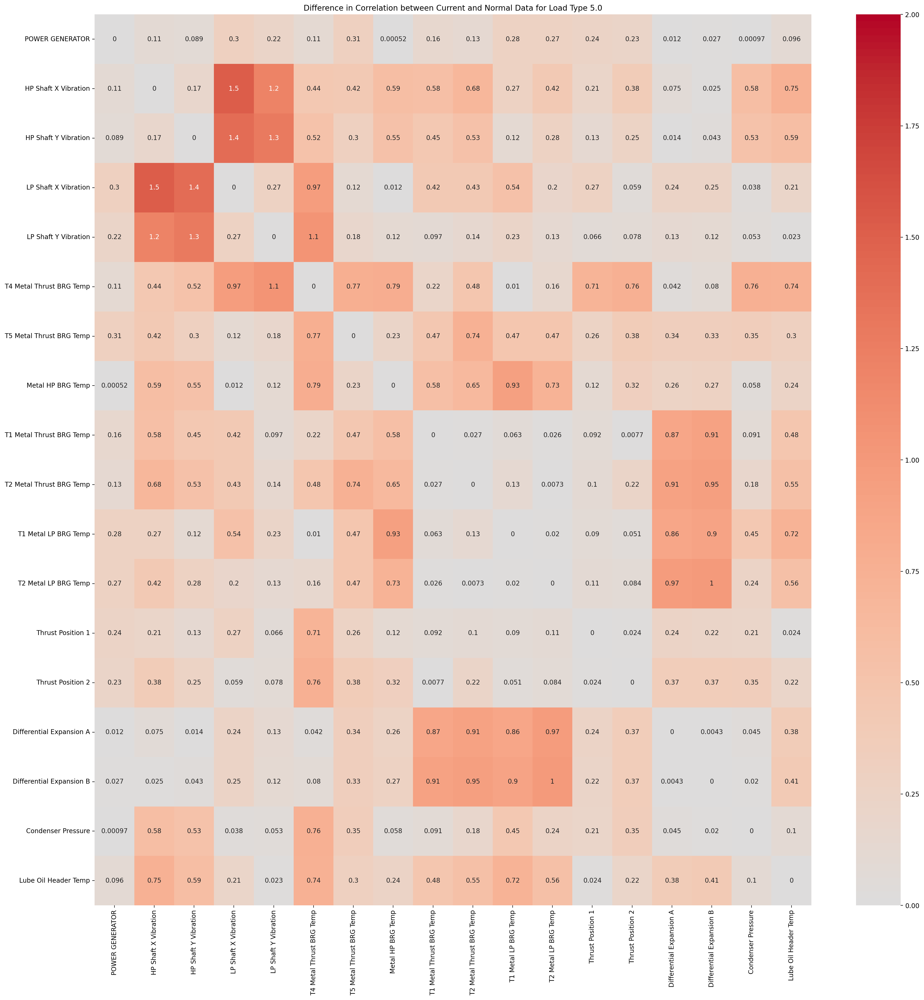

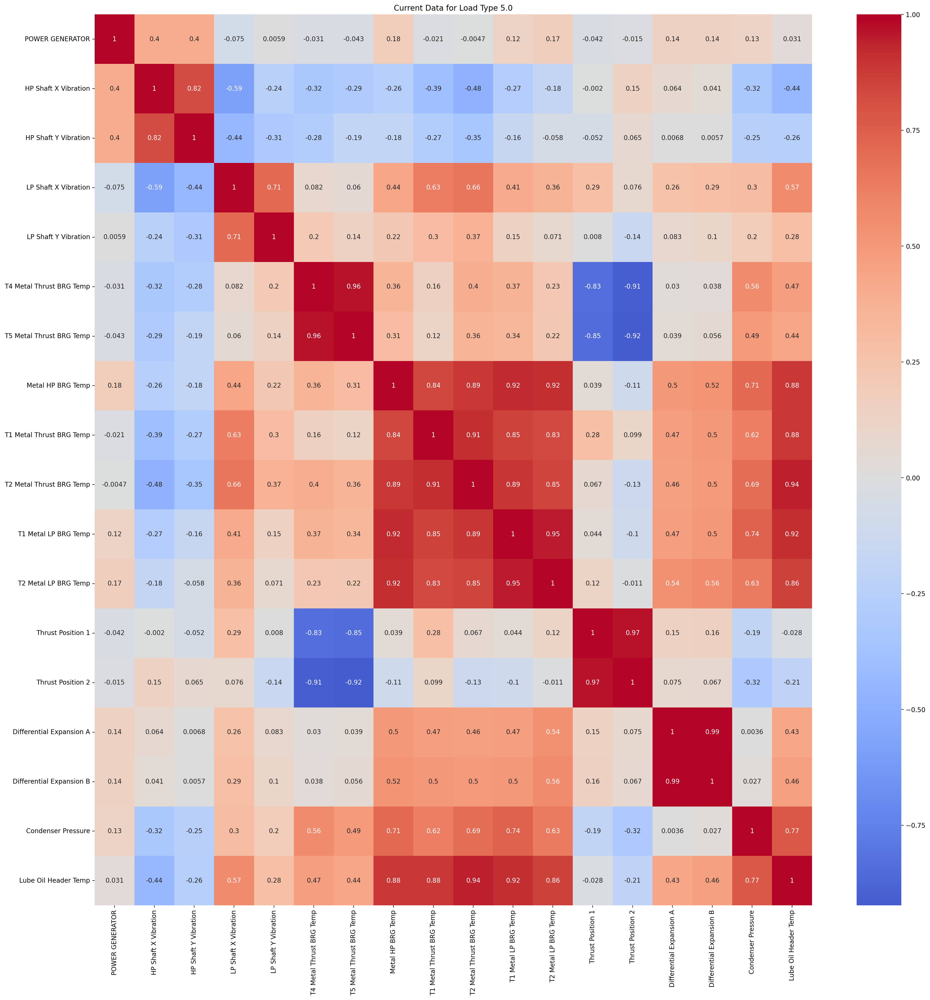

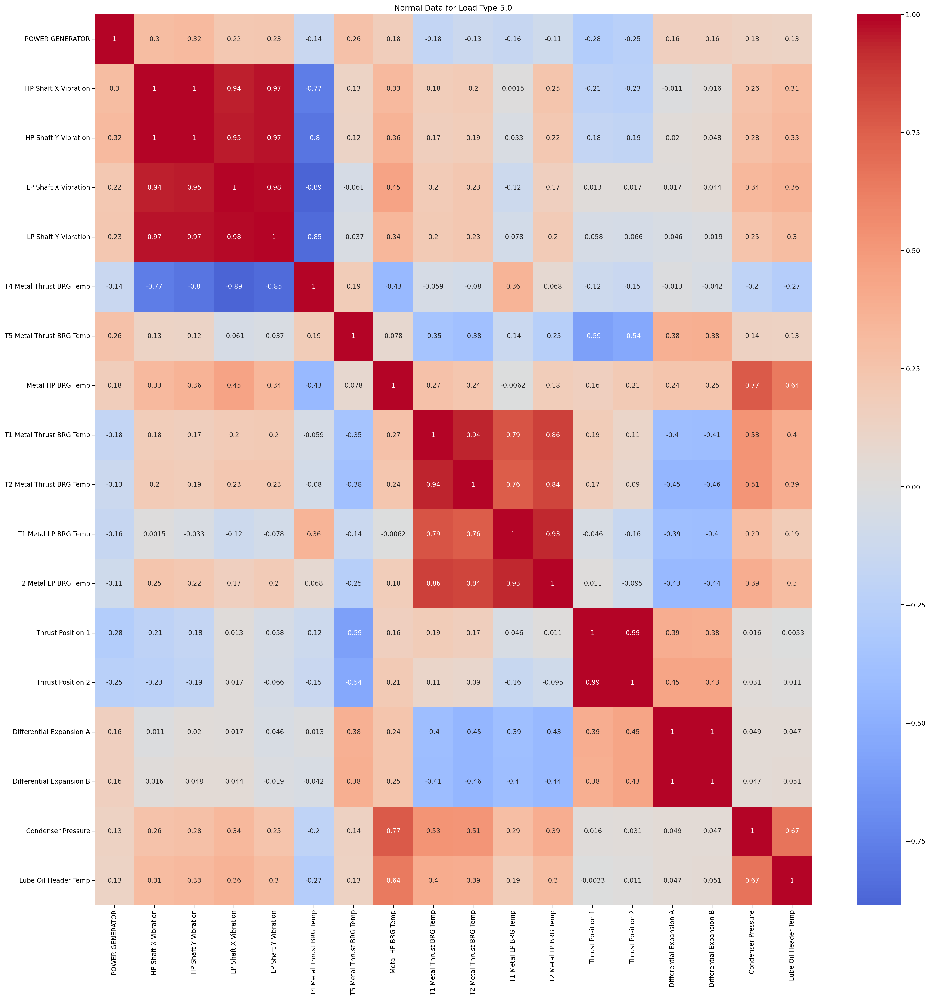

Top 10 Correlation Differences 5.0 :


,Pair,Difference,Corr_Current,Corr_Normal,Load_Type
0,"(LP Shaft X Vibration, HP Shaft X Vibration)",1.529989,-0.586651,0.943338,5.0
1,"(LP Shaft X Vibration, HP Shaft Y Vibration)",1.390947,-0.436691,0.954257,5.0
2,"(LP Shaft Y Vibration, HP Shaft Y Vibration)",1.284490,-0.314861,0.969629,5.0
3,"(LP Shaft Y Vibration, HP Shaft X Vibration)",1.206139,-0.239938,0.966201,5.0
4,"(T4 Metal Thrust BRG Temp, LP Shaft Y Vibration)",1.056677,0.204866,-0.851812,5.0
5,"(Differential Expansion B, T2 Metal LP BRG Temp)",0.996528,0.561336,-0.435192,5.0
6,"(Differential Expansion A, T2 Metal LP BRG Temp)",0.969895,0.540168,-0.429727,5.0
7,"(T4 Metal Thrust BRG Temp, LP Shaft X Vibration)",0.967922,0.081506,-0.886416,5.0
8,"(Differential Expansion B, T2 Metal Thrust BRG Temp)",0.952460,0.496604,-0.455856,5.0
9,"(T1 Metal LP BRG Temp, Metal HP BRG Temp)",0.929805,0.923610,-0.006195,5.0




Load Type: 6.0


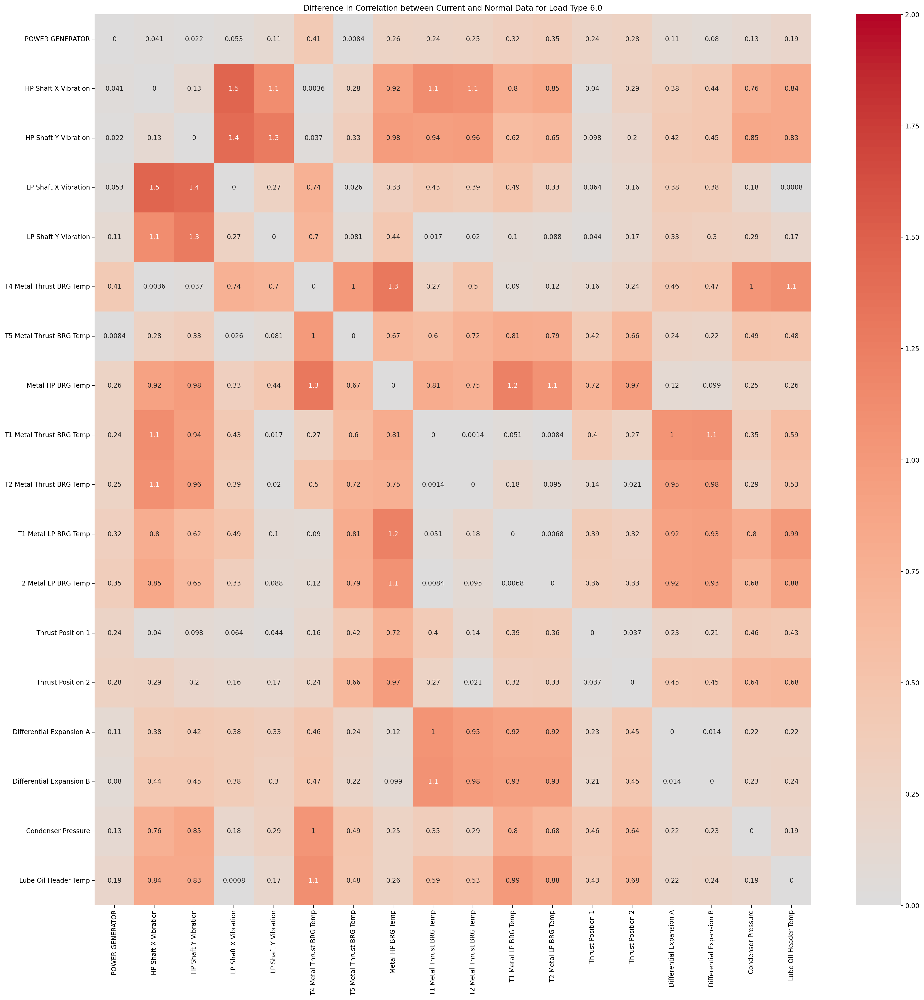

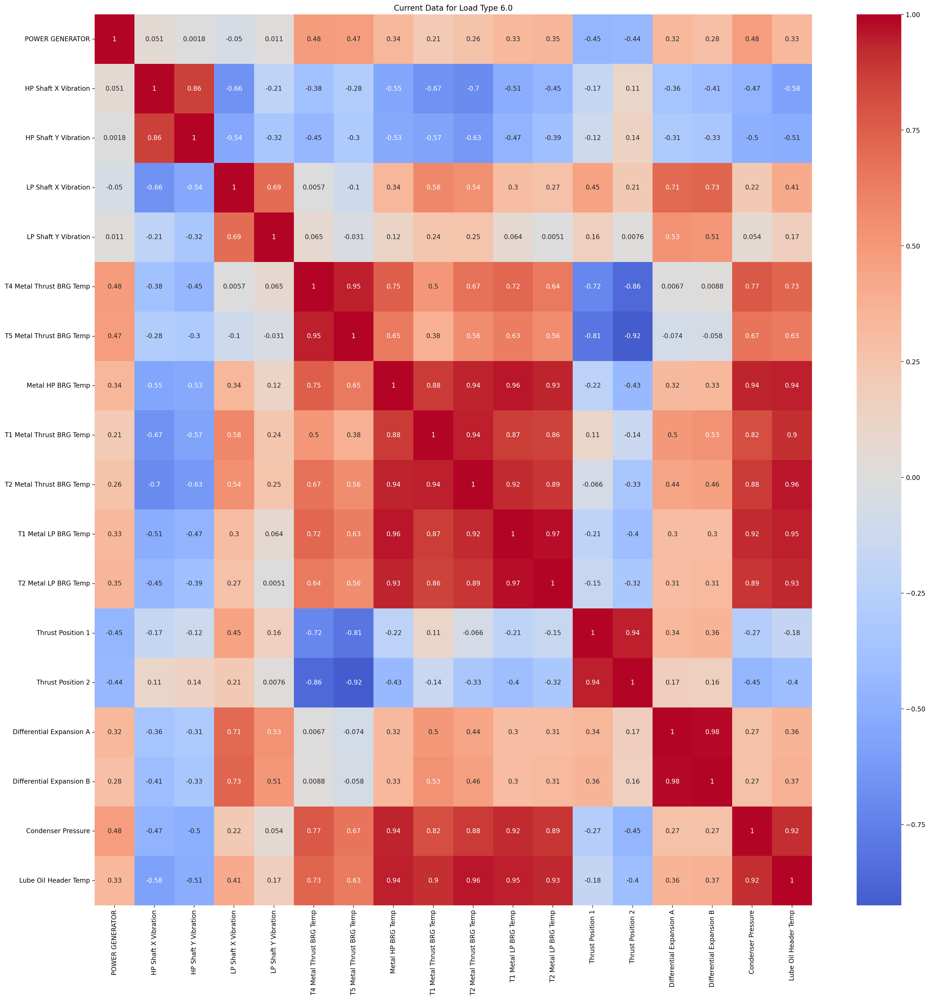

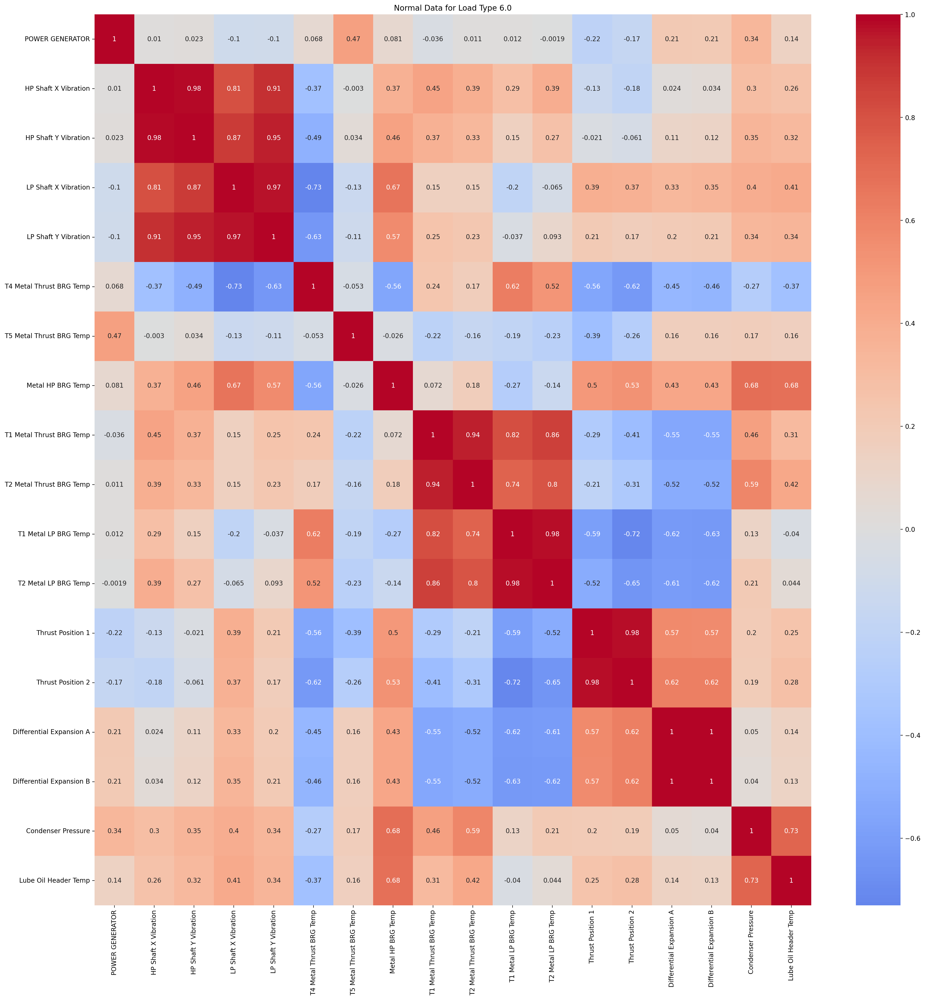

Top 10 Correlation Differences 6.0 :


,Pair,Difference,Corr_Current,Corr_Normal,Load_Type
0,"(LP Shaft X Vibration, HP Shaft X Vibration)",1.464396,-0.657639,0.806757,6.0
1,"(LP Shaft X Vibration, HP Shaft Y Vibration)",1.410436,-0.536639,0.873797,6.0
2,"(Metal HP BRG Temp, T4 Metal Thrust BRG Temp)",1.310840,0.751763,-0.559078,6.0
3,"(LP Shaft Y Vibration, HP Shaft Y Vibration)",1.272800,-0.324934,0.947866,6.0
4,"(T1 Metal LP BRG Temp, Metal HP BRG Temp)",1.228184,0.961005,-0.267179,6.0
5,"(LP Shaft Y Vibration, HP Shaft X Vibration)",1.116232,-0.207557,0.908675,6.0
6,"(T1 Metal Thrust BRG Temp, HP Shaft X Vibration)",1.114741,-0.665558,0.449182,6.0
7,"(Lube Oil Header Temp, T4 Metal Thrust BRG Temp)",1.102617,0.728017,-0.374599,6.0
8,"(T2 Metal Thrust BRG Temp, HP Shaft X Vibration)",1.080190,-0.695015,0.385175,6.0
9,"(Differential Expansion B, T1 Metal Thrust BRG Temp)",1.076770,0.529709,-0.547061,6.0




Load Type: 7.0


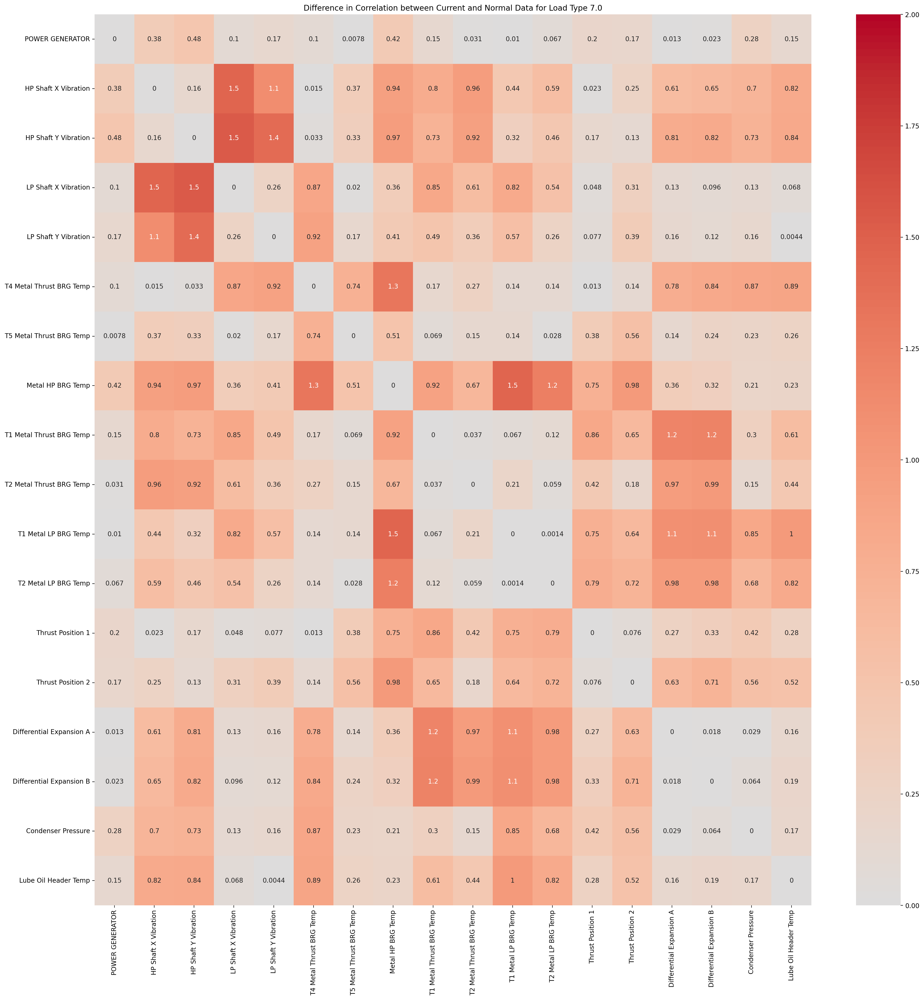

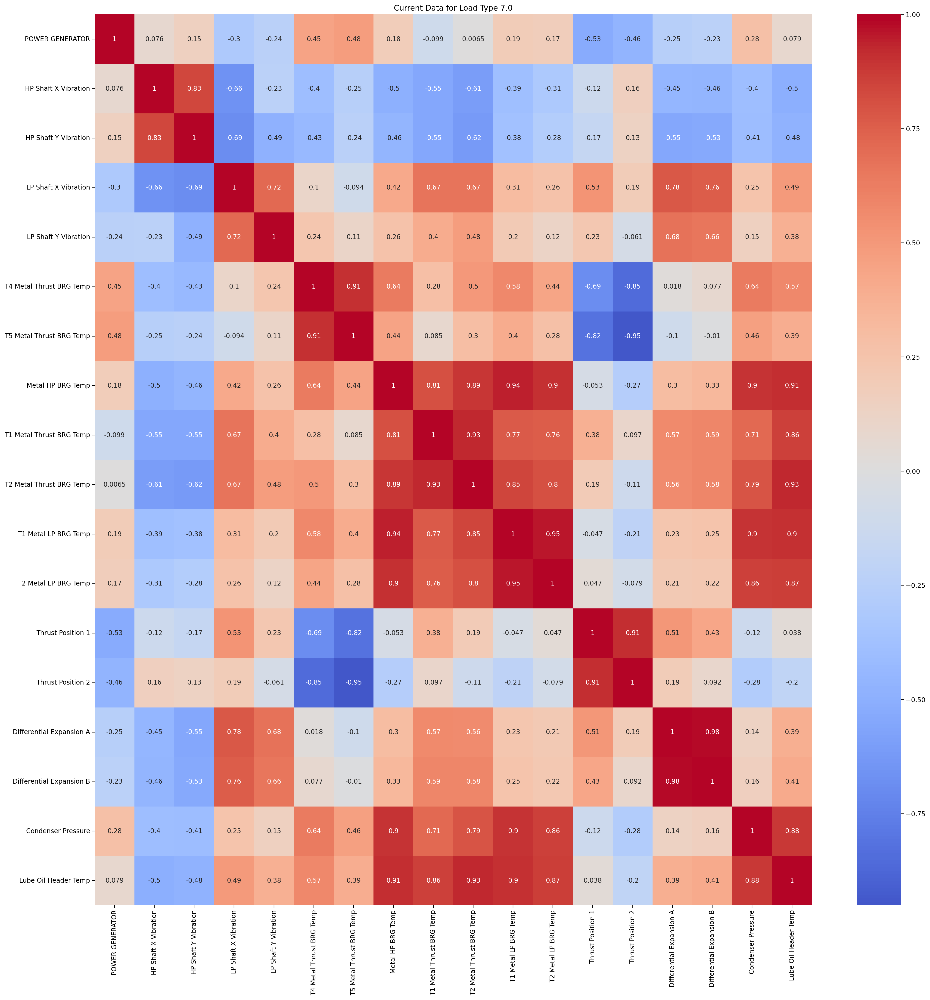

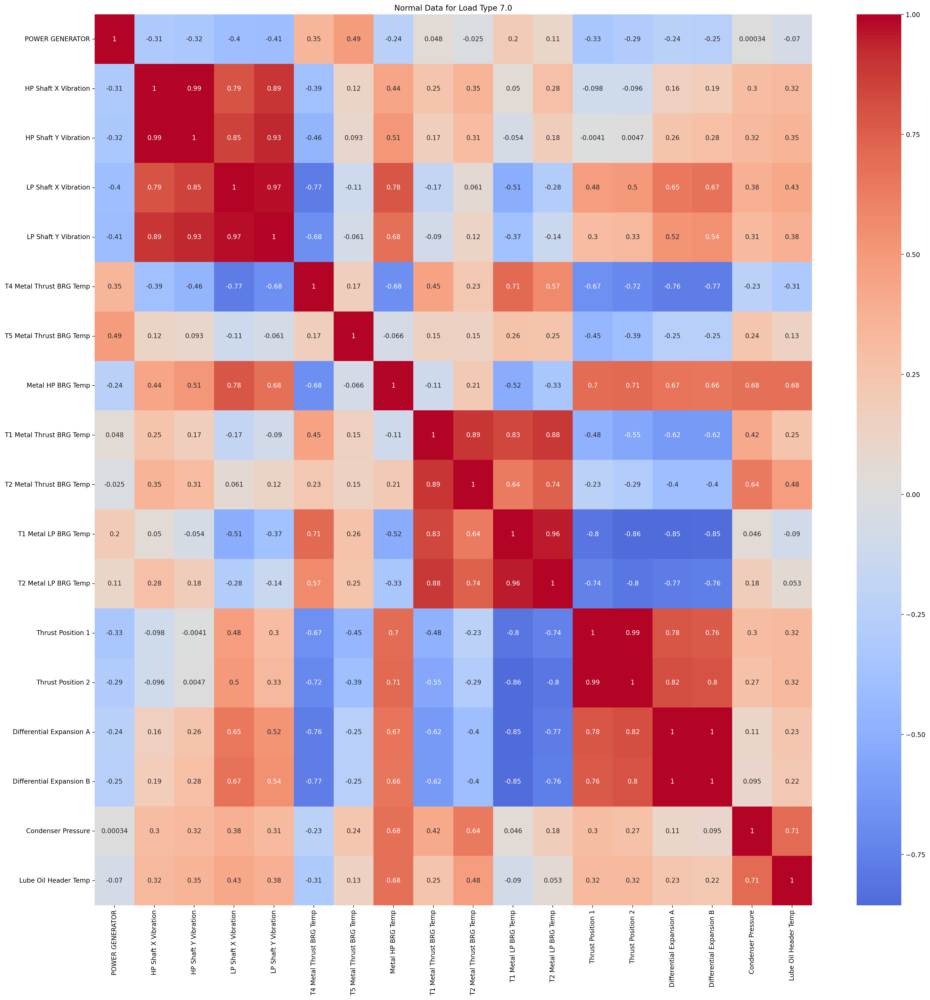

Top 10 Correlation Differences 7.0 :


,Pair,Difference,Corr_Current,Corr_Normal,Load_Type
0,"(LP Shaft X Vibration, HP Shaft Y Vibration)",1.540543,-0.689011,0.851532,7.0
1,"(T1 Metal LP BRG Temp, Metal HP BRG Temp)",1.463786,0.941486,-0.522300,7.0
2,"(LP Shaft X Vibration, HP Shaft X Vibration)",1.455115,-0.662004,0.793110,7.0
3,"(LP Shaft Y Vibration, HP Shaft Y Vibration)",1.419229,-0.489345,0.929884,7.0
4,"(Metal HP BRG Temp, T4 Metal Thrust BRG Temp)",1.316933,0.637004,-0.679929,7.0
5,"(T2 Metal LP BRG Temp, Metal HP BRG Temp)",1.235407,0.900945,-0.334462,7.0
6,"(Differential Expansion B, T1 Metal Thrust BRG Temp)",1.203175,0.586168,-0.617008,7.0
7,"(Differential Expansion A, T1 Metal Thrust BRG Temp)",1.191305,0.569342,-0.621963,7.0
8,"(LP Shaft Y Vibration, HP Shaft X Vibration)",1.117743,-0.230721,0.887022,7.0
9,"(Differential Expansion B, T1 Metal LP BRG Temp)",1.098299,0.250360,-0.847939,7.0




Concatenated DataFrame:


,Pair,Difference,Corr_Current,Corr_Normal,Load_Type
0,"(LP Shaft X Vibration, HP Shaft X Vibration)",1.529989,-0.586651,0.943338,5.0
1,"(LP Shaft X Vibration, HP Shaft Y Vibration)",1.390947,-0.436691,0.954257,5.0
2,"(LP Shaft Y Vibration, HP Shaft Y Vibration)",1.284490,-0.314861,0.969629,5.0
3,"(LP Shaft Y Vibration, HP Shaft X Vibration)",1.206139,-0.239938,0.966201,5.0
4,"(T4 Metal Thrust BRG Temp, LP Shaft Y Vibration)",1.056677,0.204866,-0.851812,5.0
5,"(Differential Expansion B, T2 Metal LP BRG Temp)",0.996528,0.561336,-0.435192,5.0
6,"(Differential Expansion A, T2 Metal LP BRG Temp)",0.969895,0.540168,-0.429727,5.0
7,"(T4 Metal Thrust BRG Temp, LP Shaft X Vibration)",0.967922,0.081506,-0.886416,5.0
8,"(Differential Expansion B, T2 Metal Thrust BRG Temp)",0.952460,0.496604,-0.455856,5.0
9,"(T1 Metal LP BRG Temp, Metal HP BRG Temp)",0.929805,0.923610,-0.006195,5.0


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_current and df_normal are DataFrames with some data and have a 'load_type' column
load_types = np.sort(df_current['load_type'].unique())

# Define the fixed scale for the heatmaps
vmin = 0
vmax = 2

# Load the current dataset
df_current = df_new.copy()
# Load the reference normal dataset
df_normal = df_old.copy()

exclude_columns = ['year', 'month','week','day','hour','load_type']

# Create an empty dataframe to hold the concatenated top 10 dataframes
concatenated_df = pd.DataFrame()


for load_type in load_types:
    #if(load_type == 2.00 or load_type == 3.00):
      print(f"Load Type: {load_type}")

      # Filter the DataFrames based on the current load type
      df_current_load_type = df_current[df_current['load_type'] == load_type]
      df_normal_load_type = df_normal[df_normal['load_type'] == load_type]

      # Calculate correlation matrices for both DataFrames
      corr_current = df_current_load_type.drop(exclude_columns, axis=1).corr()
      corr_normal = df_normal_load_type.drop(exclude_columns, axis=1).corr()

      # Find the difference between correlation matrices
      corr_difference = abs(corr_current - corr_normal)

      # Plot the heatmap of the difference in correlation
      plt.figure(figsize=(25, 25))
      sns.heatmap(corr_difference, annot=True, cmap="coolwarm", center=0, vmin=vmin, vmax=vmax)
      plt.title(f"Difference in Correlation between Current and Normal Data for Load Type {load_type}")
      plt.show()
      plt.figure(figsize=(25, 25))
      sns.heatmap(corr_current, annot=True, cmap="coolwarm", center=0)
      plt.title(f"Current Data for Load Type {load_type}")
      plt.show()
      plt.figure(figsize=(25, 25))
      sns.heatmap(corr_normal, annot=True, cmap="coolwarm", center=0)
      plt.title(f"Normal Data for Load Type {load_type}")
      plt.show()

      # Flatten the correlation difference matrix and remove self-correlations (diagonal elements)
      corr_difference_flat = corr_difference.where(~np.triu(np.ones(corr_difference.shape)).astype(np.bool)).stack()

      # Sort by the absolute value of differences and select the top 10
      top_10_differences = corr_difference_flat.abs().sort_values(ascending=False).head(10)

      # Create a DataFrame for the top 10 correlation differences with corresponding correlations from corr_current and corr_normal
      data = []
      for index, value in top_10_differences.items():
          data.append({'Pair': index, 'Difference': value, 'Corr_Current': corr_current.at[index], 'Corr_Normal': corr_normal.at[index], 'Load_Type': load_type})
      top_10_df = pd.DataFrame(data)

      # Append the top 10 dataframe to the concatenated dataframe
      concatenated_df = pd.concat([concatenated_df, top_10_df], ignore_index=True)

      # Print the top 10 correlation differences DataFrame
      print("Top 10 Correlation Differences "+str(load_type)+ " :")
      display(top_10_df)
      print("\n")

# Print the concatenated dataframe
print("Concatenated DataFrame:")
display(concatenated_df)

In [ ]:
corr_normal

,POWER GENERATOR,HP Shaft X Vibration,HP Shaft Y Vibration,LP Shaft X Vibration,LP Shaft Y Vibration,T4 Metal Thrust BRG Temp,T5 Metal Thrust BRG Temp,Metal HP BRG Temp,T1 Metal Thrust BRG Temp,T2 Metal Thrust BRG Temp,T1 Metal LP BRG Temp,T2 Metal LP BRG Temp,Thrust Position 1,Thrust Position 2,Differential Expansion A,Differential Expansion B,Condenser Pressure,Lube Oil Header Temp
POWER GENERATOR,1.000000,-0.307385,-0.324967,-0.404477,-0.408276,0.345406,0.486606,-0.237933,0.047920,-0.024647,0.198627,0.107889,-0.334689,-0.291898,-0.240565,-0.251058,0.000338,-0.070462
HP Shaft X Vibration,-0.307385,1.000000,0.991118,0.793110,0.887022,-0.386318,0.118470,0.439357,0.247015,0.350007,0.049683,0.277978,-0.098403,-0.095692,0.163283,0.187059,0.300820,0.319163
HP Shaft Y Vibration,-0.324967,0.991118,1.000000,0.851532,0.929884,-0.463420,0.093022,0.509209,0.172781,0.307136,-0.054403,0.180282,-0.004067,0.004687,0.259548,0.283117,0.320402,0.353253
LP Shaft X Vibration,-0.404477,0.793110,0.851532,1.000000,0.971582,-0.769907,-0.114666,0.776618,-0.174453,0.061086,-0.508552,-0.280145,0.478752,0.498978,0.650521,0.666604,0.380695,0.425961
LP Shaft Y Vibration,-0.408276,0.887022,0.929884,0.971582,1.000000,-0.680493,-0.060728,0.678905,-0.089666,0.117403,-0.373892,-0.138174,0.304949,0.325109,0.522999,0.543155,0.313947,0.378247
T4 Metal Thrust BRG Temp,0.345406,-0.386318,-0.463420,-0.769907,-0.680493,1.000000,0.173209,-0.679929,0.453381,0.228820,0.714359,0.572692,-0.673423,-0.717621,-0.763504,-0.765368,-0.228533,-0.311968
T5 Metal Thrust BRG Temp,0.486606,0.118470,0.093022,-0.114666,-0.060728,0.173209,1.000000,-0.066216,0.153886,0.147670,0.261996,0.250946,-0.445742,-0.394717,-0.247683,-0.252551,0.235005,0.134097
Metal HP BRG Temp,-0.237933,0.439357,0.509209,0.776618,0.678905,-0.679929,-0.066216,1.000000,-0.108676,0.212961,-0.522300,-0.334462,0.695804,0.713802,0.665872,0.655962,0.682386,0.683319
T1 Metal Thrust BRG Temp,0.047920,0.247015,0.172781,-0.174453,-0.089666,0.453381,0.153886,-0.108676,1.000000,0.888330,0.834383,0.881510,-0.481566,-0.550427,-0.621963,-0.617008,0.417319,0.251848
T2 Metal Thrust BRG Temp,-0.024647,0.350007,0.307136,0.061086,0.117403,0.228820,0.147670,0.212961,0.888330,1.000000,0.637356,0.743933,-0.229269,-0.289090,-0.403621,-0.403192,0.640506,0.484037


In [ ]:
df_concat.to_csv('df_concat.csv',index=False)

Density Plot

In [ ]:
#Density Plot
import os
from google.colab import drive

# Mount your Google Drive
drive.mount('/content/drive')

# Create a folder on your Google Drive to save the plots
if not os.path.exists('/content/drive/MyDrive/MyPlots/GNPM_GT11'):
    os.makedirs('/content/drive/MyDrive/MyPlots/GNPM_GT11')

# Load the current dataset
# df_current = df_new
df_current = df_new.copy()
# Load the reference normal dataset
df_normal = df_old.copy()

# Define the weights for each sensor in each load type
weights_dict = {}

# Get the unique values of the load_type column in df_current
load_types = np.sort(df_current['load_type'].unique())

sum_weight = 0 #V1.1++
#Cal load type proportion\
total_count = sum(load_types)  # Calculate the total count of occurrences
weights = [count / total_count for count in load_types]  # Calculate the proportions as weights
load_weights = dict(zip(load_types, weights))  # Create a dictionary mapping load types to their weights
print("Load Type\tProportion (Weight)")
for load_type, weight in load_weights.items():
  print(f"{load_type}\t\t{weight:.2f}")


# Call the function to detect anomalies for each load type

overall_anomaly_score_summary={}
overall_centralize_differ_score_summary={}
overall_anomaly_score_summary_weighted={} #V1.1++
overall_centralize_differ_score_summary_weighted={} #V1.1++
df_concat=pd.DataFrame()

#weight every sensor to 1
weights_load_type={}
for obj in list_sensor:
    weights_load_type[obj] = 1

for load_type in load_types:
  print("load type "+ str(load_type))
 # if load_type == 0:
  #  overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type0,df_concat=df_concat,day=999)
 # if load_type == 1:
 #   overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type1,df_concat=df_concat,day=999)
  if load_type == 2:
    overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type,df_concat=df_concat,day=999)
  elif load_type == 3:
    overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type,df_concat=df_concat,day=999)
  elif load_type == 4:
    overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type,df_concat=df_concat,day=999)
  elif load_type == 5:
    overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type,df_concat=df_concat,day=999)
  elif load_type == 6:
    overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type,df_concat=df_concat,day=999)
  elif load_type == 7:
    overall_anomaly_score, overall_centralize_differ_score,df_concat = detect_anomalies(df_current, df_normal, load_type, weights_dict=weights_load_type,df_concat=df_concat,day=999)